Data analysis of "SberAutosubscription" and ML model for automation of decision making over whether the company should give rent car to particular person or not.

Author : Umidjon Sattorov. Student at "Skillbox" platform

Data Analysis

In [3]:
#Importing all essential modules
import pandas as pd
import numpy as np 

import shapefile as shp
import seaborn as sns
import matplotlib.pyplot as plt

#Hyphothesis analysis libraries
import scipy
import scipy.stats as stats

#Machine learning algorithms 
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, Normalizer, StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

#Preserving machine learning model
import pickle as pkl

In [4]:
#Downloading data and loading it for data analysis
df = pd.read_csv(filepath_or_buffer = "./data/ga_hits.csv")
df.head(10)

,session_id,hit_date,hit_time,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_action,event_label,event_value
0,5639623078712724064.1640254056.1640254056,2021-12-23,597864.0,30,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,quiz,quiz_show,NaN,NaN
1,7750352294969115059.1640271109.1640271109,2021-12-23,597331.0,41,event,NaN,sberauto.com/cars/fiat?city=1&city=18&rental_c...,quiz,quiz_show,NaN,NaN
2,885342191847998240.1640235807.1640235807,2021-12-23,796252.0,49,event,NaN,sberauto.com/cars/all/volkswagen/polo/e994838f...,quiz,quiz_show,NaN,NaN
3,142526202120934167.1640211014.1640211014,2021-12-23,934292.0,46,event,NaN,sberauto.com/cars?utm_source_initial=yandex&ut...,quiz,quiz_show,NaN,NaN
4,3450086108837475701.1640265078.1640265078,2021-12-23,768741.0,79,event,NaN,sberauto.com/cars/all/mercedes-benz/cla-klasse...,quiz,quiz_show,NaN,NaN
5,6466333295973247896.1640246168.1640246168,2021-12-23,704194.0,41,event,NaN,sberauto.com/cars?utm_source_initial=youtube&u...,quiz,quiz_show,NaN,NaN
6,281215510786615563.1640245516.1640245516,2021-12-23,911854.0,102,event,NaN,sberauto.com/cars/toyota?isnew=false&rental_ca...,quiz,quiz_show,NaN,NaN
7,4024492994895054107.1640269084.1640269084,2021-12-23,1071804.0,85,event,NaN,sberauto.com/cars/all/mercedes-benz/glc/f8f330...,quiz,quiz_show,NaN,NaN
8,555009234841130092.1640256620.1640256620,2021-12-23,1013899.0,101,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars/all/kia/sorento/c38179cb?utm...,quiz,quiz_show,NaN,NaN
9,2692901778487480807.1640206845.1640206845,2021-12-23,0.0,1,event,NaN,sberauto.com/cars/all/nissan/x-trail/0744675f?...,card_web,view_card,NaN,NaN


The column information

session_id - id of user visit

hit_date - the date of event

hit_time - the time of event(how much time user spent for the purpose of the event like the time for doing quiz in the website)

hit_number - session number of event

hit_type - type of the event

hit_referer - the source of event

hit_page_path - event page

event_category - the type of event by category

event_action - the type of action on the page

event_label - action tag

event_value - the result of the event

In [5]:
#Downloading data and loading it for data analysis
df_session = pd.read_csv(filepath_or_buffer = './data/ga_sessions.csv')
df_session.head()

C:\Users\User\AppData\Local\Temp\ipykernel_18148\711728231.py:2: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_session = pd.read_csv(filepath_or_buffer = './data/ga_sessions.csv')


,session_id,client_id,visit_date,visit_time,visit_number,utm_source,utm_medium,utm_campaign,utm_adcontent,utm_keyword,device_category,device_os,device_brand,device_model,device_screen_resolution,device_browser,geo_country,geo_city
0,9055434745589932991.1637753792.1637753792,2108382700.163776,2021-11-24,14:36:32,1,ZpYIoDJMcFzVoPFsHGJL,banner,LEoPHuyFvzoNfnzGgfcd,vCIpmpaGBnIQhyYNkXqp,puhZPIYqKXeFPaUviSjo,mobile,Android,Huawei,NaN,360x720,Chrome,Russia,Zlatoust
1,905544597018549464.1636867290.1636867290,210838531.163687,2021-11-14,08:21:30,1,MvfHsxITijuriZxsqZqt,cpm,FTjNLDyTrXaWYgZymFkV,xhoenQgDQsgfEPYNPwKO,IGUCNvHlhfHpROGclCit,mobile,Android,Samsung,NaN,385x854,Samsung Internet,Russia,Moscow
2,9055446045651783499.1640648526.1640648526,2108385331.164065,2021-12-28,02:42:06,1,ZpYIoDJMcFzVoPFsHGJL,banner,LEoPHuyFvzoNfnzGgfcd,vCIpmpaGBnIQhyYNkXqp,puhZPIYqKXeFPaUviSjo,mobile,Android,Huawei,NaN,360x720,Chrome,Russia,Krasnoyarsk
3,9055447046360770272.1622255328.1622255328,2108385564.162225,2021-05-29,05:00:00,1,kjsLglQLzykiRbcDiGcD,cpc,NaN,NOBKLgtuvqYWkXQHeYWM,NaN,mobile,NaN,Xiaomi,NaN,393x786,Chrome,Russia,Moscow
4,9055447046360770272.1622255345.1622255345,2108385564.162225,2021-05-29,05:00:00,2,kjsLglQLzykiRbcDiGcD,cpc,NaN,NaN,NaN,mobile,NaN,Xiaomi,NaN,393x786,Chrome,Russia,Moscow


Concatenation of two datasets together based on a indistinct feature

The column information of ga_session dataset

session_id - the id of user visit

client_id - the id of the user

visit_date - the date of the visit

visit_time - the time of the visit

visit_number - how much user visited to our website

utm-source - acquisition channel

utm_medium -  attraction type

utm_campaign - advertising campaign

utm_keyword - keyword for utm

device_category - the type of user device

device_os - operational system of the user

device_brand - the brand of the device utilized by user

device_model - the model of the device

device_screen_resolution - the resolution of the device

In [6]:
total_dataframe = pd.merge(left = df, right = df_session, on = "session_id")
total_dataframe.head(10)

,session_id,hit_date,hit_time,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_action,event_label,...,utm_adcontent,utm_keyword,device_category,device_os,device_brand,device_model,device_screen_resolution,device_browser,geo_country,geo_city
0,5639623078712724064.1640254056.1640254056,2021-12-23,597864.0,30,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,quiz,quiz_show,NaN,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
1,5639623078712724064.1640254056.1640254056,2021-12-23,290095.0,12,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,view_new_card,NaN,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
2,5639623078712724064.1640254056.1640254056,2021-12-23,294857.0,18,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,view_new_card,NaN,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
3,5639623078712724064.1640254056.1640254056,2021-12-23,295591.0,20,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,view_new_card,NaN,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
4,5639623078712724064.1640254056.1640254056,2021-12-23,290039.0,8,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,view_new_card,NaN,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
5,5639623078712724064.1640254056.1640254056,2021-12-23,613691.0,32,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,cars,view_more_click,pzAKUYdRKNEUXxxBFUPX,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
6,5639623078712724064.1640254056.1640254056,2021-12-23,3236.0,3,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,search_form,search_form_search_btn,ghOrjqpgskpGHSFfBBsi,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
7,5639623078712724064.1640254056.1640254056,2021-12-23,641265.0,36,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,sap_search_form,sap_search_form_cost_to,jOPfFITDxmtSmbGMhcGw,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
8,5639623078712724064.1640254056.1640254056,2021-12-23,294847.0,15,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,view_card,NaN,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg
9,5639623078712724064.1640254056.1640254056,2021-12-23,531828.0,26,event,NaN,sberauto.com/cars/all/volvo/s90/a231b204?utm_s...,card_web,view_new_card,NaN,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Saint Petersburg


In [5]:
total_dataframe.dtypes

session_id                   object
hit_date                     object
hit_time                    float64
hit_number                    int64
hit_type                     object
hit_referer                  object
hit_page_path                object
event_category               object
event_action                 object
event_label                  object
event_value                 float64
client_id                    object
visit_date                   object
visit_time                   object
visit_number                  int64
utm_source                   object
utm_medium                   object
utm_campaign                 object
utm_adcontent                object
utm_keyword                  object
device_category              object
device_os                    object
device_brand                 object
device_model                 object
device_screen_resolution     object
device_browser               object
geo_country                  object
geo_city                    

In [7]:
dict(zip(total_dataframe.dtypes.index, total_dataframe.dtypes.values))

{'session_id': dtype('O'),
 'hit_date': dtype('O'),
 'hit_time': dtype('float64'),
 'hit_number': dtype('int64'),
 'hit_type': dtype('O'),
 'hit_referer': dtype('O'),
 'hit_page_path': dtype('O'),
 'event_category': dtype('O'),
 'event_action': dtype('O'),
 'event_label': dtype('O'),
 'event_value': dtype('float64'),
 'client_id': dtype('O'),
 'visit_date': dtype('O'),
 'visit_time': dtype('O'),
 'visit_number': dtype('int64'),
 'utm_source': dtype('O'),
 'utm_medium': dtype('O'),
 'utm_campaign': dtype('O'),
 'utm_adcontent': dtype('O'),
 'utm_keyword': dtype('O'),
 'device_category': dtype('O'),
 'device_os': dtype('O'),
 'device_brand': dtype('O'),
 'device_model': dtype('O'),
 'device_screen_resolution': dtype('O'),
 'device_browser': dtype('O'),
 'geo_country': dtype('O'),
 'geo_city': dtype('O')}

In [8]:
#Getting samples from dataset for checking models performance
total_dataframe.sample(10)

,session_id,hit_date,hit_time,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_action,event_label,...,utm_adcontent,utm_keyword,device_category,device_os,device_brand,device_model,device_screen_resolution,device_browser,geo_country,geo_city
8445066,5428048814985145024.1621846720.1621846720,2021-05-24,NaN,4,event,HbolMJUevblAbkHClEQa,podpiska.sberauto.com/,sub_button_click,sub_view_cars_click,vodKSlUobUWTVlgsJqdI,...,JNHcPlZPxEMWDnRiyoBf,NaN,desktop,NaN,NaN,NaN,1920x1080,YaBrowser,Russia,Moscow
9674061,870082843050240442.1630267834.1630267834,2021-08-29,NaN,22,event,HbolMJUevblAbkHClEQa,sberauto.com/cars/f6bbfae9?rental_page=rental_car,card_web,view_card,KclpemfoHstknWHFiLit,...,JNHcPlZPxEMWDnRiyoBf,NaN,mobile,NaN,Apple,NaN,414x896,Safari,Russia,Moscow
6642352,2794922808120661180.1624454050.1624454050,2021-06-23,NaN,11,event,HbolMJUevblAbkHClEQa,sberauto.com/cars/bf24b977?rental_page=rental_car,card_web,view_new_card,KclpemfoHstknWHFiLit,...,JNHcPlZPxEMWDnRiyoBf,NaN,desktop,NaN,NaN,NaN,1920x1080,Chrome,Russia,Kazan
4074931,5579365993219562794.1640313310.1640313310,2021-12-24,19337.0,11,event,NaN,podpiska.sberauto.com/,sub_page_view,sub_landing,NaN,...,vCIpmpaGBnIQhyYNkXqp,puhZPIYqKXeFPaUviSjo,mobile,Android,Xiaomi,NaN,393x851,Chrome,Russia,Saint Petersburg
2521722,8689075285076145582.1637283248.1637283248,2021-11-19,322.0,3,event,NaN,podpiska.sberauto.com/,sub_page_view,sub_landing,NaN,...,SAVVWaMghGnnvPOqMOIt,puhZPIYqKXeFPaUviSjo,mobile,Android,Huawei,NaN,360x800,Chrome,Russia,Moscow
3996739,8050476981749928726.1640153066.1640153066,2021-12-22,20932.0,90,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,view_new_card,NaN,...,NaN,ITfrGJNwVsHBGJMAKoct,desktop,Windows,NaN,NaN,1920x1080,Chrome,Russia,Voronezh
14984281,957973958579669501.1634429521.1634429521,2021-10-17,NaN,14,event,HbolMJUevblAbkHClEQa,sberauto.com/cars/all/lada-vaz/vesta/2fc745ed?...,card_web,view_card,KclpemfoHstknWHFiLit,...,JNHcPlZPxEMWDnRiyoBf,NaN,mobile,NaN,Huawei,NaN,320x640,Chrome,Russia,Chita
10092794,6055716164559829574.1630403141.1630403141,2021-08-31,NaN,24,event,HbolMJUevblAbkHClEQa,sberauto.com/cars/2fc745ed?utm_source_initial=...,ad_banner,analystlabel,KclpemfoHstknWHFiLit,...,JNHcPlZPxEMWDnRiyoBf,NaN,mobile,NaN,Samsung,NaN,384x854,Chrome,Russia,Moscow
15240166,224576711897409720.1635281083.1635281083,2021-10-26,175624.0,24,event,NaN,sberauto.com/cars/all/toyota/land-cruiser-prad...,card_web,view_new_card,NaN,...,xhoenQgDQsgfEPYNPwKO,RkpOyeEPgcMBSDuHLQcj,mobile,iOS,Apple,NaN,414x736,Safari,Russia,Moscow
5715782,6888214468718038321.1621429553.1621429553,2021-05-19,NaN,4,event,HbolMJUevblAbkHClEQa,/cars/13bf0fce,card_web,view_card,KclpemfoHstknWHFiLit,...,JNHcPlZPxEMWDnRiyoBf,NaN,mobile,NaN,Apple,NaN,375x812,Safari,Russia,Barnaul


In [15]:
total_dataframe.isna().sum(axis = 1).sort_values().index[:5].tolist()

[5429033, 11592907, 1790402, 5443607, 4644820]

In [17]:
total_dataframe.iloc[total_dataframe.isna().sum(axis = 1).sort_values().index[:5].tolist()]

,session_id,hit_date,hit_time,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_action,event_label,...,utm_adcontent,utm_keyword,device_category,device_os,device_brand,device_model,device_screen_resolution,device_browser,geo_country,geo_city
5429033,4862421774103734026.1638019590.1638019590,2021-11-27,20439.0,4,event,sAGDBCdeVPmQPwkVEcIX,podpiska.sberauto.com/,sub_button_click,sub_view_cars_click,vodKSlUobUWTVlgsJqdI,...,JNHcPlZPxEMWDnRiyoBf,zGUBrOvMRpLqBkJPUsYo,mobile,Android,Vivo,tWBQlsvNfHxRUjaPAfhd,360x772,Chrome,Russia,Moscow
11592907,1808910948195209181.1635621238.1635621238,2021-10-30,15815.0,8,event,sAGDBCdeVPmQPwkVEcIX,podpiska.sberauto.com/,auth,start_auth,cMCEFfSnnlNHXnIdruks,...,JNHcPlZPxEMWDnRiyoBf,UKNBOHebRIIsQRsjNKay,mobile,Android,(not set),AuMdmADEIoPXiWpTsBEj,360x780,Chrome,Russia,Moscow
1790402,151154563802860362.1638272201.1638272201,2021-11-30,154077.0,4,event,sAGDBCdeVPmQPwkVEcIX,podpiska.sberauto.com/,listing_ads,go_to_car_card,hAHqGICPFQiPwtzubOzs,...,JNHcPlZPxEMWDnRiyoBf,UKNBOHebRIIsQRsjNKay,mobile,Android,Vivo,kGgpyeEtacYWhzbuuWMR,360x760,Chrome,Russia,Kaluga
5443607,2234741115753283060.1637269978.1637269978,2021-11-19,11930.0,4,event,sAGDBCdeVPmQPwkVEcIX,podpiska.sberauto.com/,sub_button_click,sub_view_cars_click,OHfyUfDKdPgBdvelDlfG,...,JNHcPlZPxEMWDnRiyoBf,UKNBOHebRIIsQRsjNKay,mobile,Android,Motorola,rTksOeVOQqJRyKCjcexB,412x915,Chrome,Russia,Saint Petersburg
4644820,2819710614885571725.1638341774.1638341774,2021-12-01,3632.0,4,event,aRqZsgdeDKmWMkyzUQQF,podpiska.sberauto.com/?yzclid=3199502861653401969,sub_button_click,sub_view_cars_click,OHfyUfDKdPgBdvelDlfG,...,LLfCasrxQzJIyuldcuWy,aXQzDWsJuGXeBXexNHjc,mobile,Android,(not set),AuMdmADEIoPXiWpTsBEj,424x942,Chrome,Russia,Saint Petersburg


In [1]:
def row_dict(row_index_number, file_path):
    main_keys = ['hit_date', 'hit_number', 'hit_referer', 'hit_page_path', 'event_label', 'visit_time', 'visit_number', 'utm_source', 'utm_medium', 'utm_campaign', 'utm_adcontent', 'device_category', 'device_os', 'device_screen_resolution', 'device_browser', 'geo_country', 'geo_city']
    row_data = dict(zip(total_dataframe.iloc[row_index_number].index, total_dataframe.iloc[row_index_number].values))

    with open(file_path, 'w') as file:
        for key, value in row_data.items():
            if key in main_keys:
                file.write(f'"{key}" : "{value}",\n')
    
    print(f"Dictionary is saved to {file_path}")

In [7]:
#Saving sample data with index value
file_path = './pipeline/pipeline/samples/sample_'
for i in total_dataframe.isna().sum(axis = 1).sort_values().index[:5].tolist():
    row_dict(i, file_path = file_path + str(i) + '.txt')

Dictionary is saved to ./pipeline/pipeline/samples/sample_5429033.txt
Dictionary is saved to ./pipeline/pipeline/samples/sample_11592907.txt
Dictionary is saved to ./pipeline/pipeline/samples/sample_1790402.txt
Dictionary is saved to ./pipeline/pipeline/samples/sample_5443607.txt
Dictionary is saved to ./pipeline/pipeline/samples/sample_4644820.txt


In [7]:
#Size of the dataframe
total_dataframe.shape

(15685219, 28)

In [8]:
#Checking whether there are NAN values in the dataset
total_dataframe.isna().sum().sort_values(ascending = False)

event_value                 15685219
device_model                15562932
utm_keyword                  9204827
hit_time                     9160203
device_os                    9158382
hit_referer                  6235498
device_brand                 3945875
event_label                  3727682
utm_adcontent                2832418
utm_campaign                 2198873
utm_source                       700
session_id                         0
geo_country                        0
device_browser                     0
device_screen_resolution           0
device_category                    0
visit_number                       0
utm_medium                         0
hit_date                           0
visit_time                         0
visit_date                         0
client_id                          0
event_action                       0
event_category                     0
hit_page_path                      0
hit_type                           0
hit_number                         0
g

In [9]:
#Missing value percentage
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values

The percentage of missing values in the dataset : 


event_value                 100.000000
device_model                 99.220368
utm_keyword                  58.684721
hit_time                     58.400224
device_os                    58.388614
hit_referer                  39.753975
device_brand                 25.156646
event_label                  23.765572
utm_adcontent                18.057880
utm_campaign                 14.018759
utm_source                    0.004463
session_id                    0.000000
geo_country                   0.000000
device_browser                0.000000
device_screen_resolution      0.000000
device_category               0.000000
visit_number                  0.000000
utm_medium                    0.000000
hit_date                      0.000000
visit_time                    0.000000
visit_date                    0.000000
client_id                     0.000000
event_action                  0.000000
event_category                0.000000
hit_page_path                 0.000000
hit_type                 

In [10]:
#Labelling target action column with 1 if the action in the row of the given dataset is target action and 0 if the action is not the action which we are considering
target_actions = ['sub_car_claim_click', 'sub_car_claim_submit_click', 'sub_open_dialog_click', 'sub_custom_question_submit_click', 'sub_call_number_click', 'sub_callback_submit_click', 'sub_submit_success', 'sub_car_request_submit_click']
total_dataframe['target_action'] = 0
total_dataframe.loc[total_dataframe['event_action'].isin(target_actions), 'target_action'] = 1
total_dataframe[total_dataframe['event_action'].isin(target_actions)]

,session_id,hit_date,hit_time,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_action,event_label,...,utm_keyword,device_category,device_os,device_brand,device_model,device_screen_resolution,device_browser,geo_country,geo_city,target_action
239,6466333295973247896.1640246168.1640246168,2021-12-23,2442217.0,87,event,NaN,sberauto.com/cars/all/skoda/octavia/4791c8b2?u...,sub_button_click,sub_car_claim_submit_click,NaN,...,rcScqexpyNHshwBMMfPx,desktop,Windows,NaN,NaN,1920x1080,YaBrowser,Russia,Moscow,1
261,6466333295973247896.1640246168.1640246168,2021-12-23,2442533.0,88,event,NaN,sberauto.com/cars/all/skoda/octavia/4791c8b2?u...,sub_submit,sub_submit_success,nsPPIRqjxBefONGPpnsF,...,rcScqexpyNHshwBMMfPx,desktop,Windows,NaN,NaN,1920x1080,YaBrowser,Russia,Moscow,1
279,6466333295973247896.1640246168.1640246168,2021-12-23,2434942.0,86,event,NaN,sberauto.com/cars/all/skoda/octavia/4791c8b2?u...,sub_button_click,sub_car_claim_click,EsLbNNEnCkXWoaesnKlS,...,rcScqexpyNHshwBMMfPx,desktop,Windows,NaN,NaN,1920x1080,YaBrowser,Russia,Moscow,1
1140,3509799545959915269.1640275720.1640275720,2021-12-23,39533.0,9,event,NaN,sberauto.com/cars/all/skoda/rapid/bf24b977?ren...,sub_button_click,sub_car_claim_click,EsLbNNEnCkXWoaesnKlS,...,puhZPIYqKXeFPaUviSjo,mobile,Android,Huawei,NaN,360x780,Chrome,Russia,Tula,1
1179,6661709970993885304.1640280200.1640280200,2021-12-23,34986.0,9,event,NaN,sberauto.com/cars/all/skoda/rapid/bf24b977?ren...,sub_button_click,sub_car_claim_click,EsLbNNEnCkXWoaesnKlS,...,puhZPIYqKXeFPaUviSjo,mobile,Android,Samsung,NaN,412x915,Android Webview,Russia,Saint Petersburg,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15682773,3906921911594195664.1640176339.1640176339,2021-12-22,8846.0,5,event,NaN,podpiska.sberauto.com/,sub_button_click,sub_open_dialog_click,DrwJcHfmgRDbfayCKOrQ,...,puhZPIYqKXeFPaUviSjo,mobile,Android,Xiaomi,NaN,360x760,Chrome,Russia,Moscow,1
15683864,3487456408821107745.1636356536.1636356536,2021-11-08,0.0,1,event,NaN,localhost/cars/all/hyundai/solaris/b82590a3?ab...,sub_button_click,sub_car_claim_click,EsLbNNEnCkXWoaesnKlS,...,puhZPIYqKXeFPaUviSjo,mobile,iOS,Apple,NaN,390x844,Safari,Russia,Domodedovo,1
15684166,2449210543906459314.1638895283.1638895283,2021-12-07,20720.0,4,event,NaN,podpiska.sberauto.com/,sub_button_click,sub_open_dialog_click,DrwJcHfmgRDbfayCKOrQ,...,QVwnwuQeEBRKybYuwqrE,mobile,Android,Xiaomi,NaN,873x393,Chrome,Russia,Moscow,1
15684657,6896749247357807171.1639213519.1639213519,2021-12-11,66501.0,4,event,NaN,podpiska.sberauto.com/,sub_button_click,sub_open_dialog_click,DrwJcHfmgRDbfayCKOrQ,...,puhZPIYqKXeFPaUviSjo,mobile,Android,Samsung,NaN,320x534,Chrome,Russia,Saint Petersburg,1


In [7]:
#Saving sample data with index value
row_dict(1179, file_path = './pipeline/pipeline/samples/sample_6.txt')

Dictionary is saved to ./pipeline/pipeline/samples/sample_6.txt


In [11]:
#Checking datatypes of various columns in the dataframe
total_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15685219 entries, 0 to 15685218
Data columns (total 29 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   session_id                object 
 1   hit_date                  object 
 2   hit_time                  float64
 3   hit_number                int64  
 4   hit_type                  object 
 5   hit_referer               object 
 6   hit_page_path             object 
 7   event_category            object 
 8   event_action              object 
 9   event_label               object 
 10  event_value               float64
 11  client_id                 object 
 12  visit_date                object 
 13  visit_time                object 
 14  visit_number              int64  
 15  utm_source                object 
 16  utm_medium                object 
 17  utm_campaign              object 
 18  utm_adcontent             object 
 19  utm_keyword               object 
 20  device_category       

In [12]:
tld = total_dataframe

In [13]:
#Removing unessential columns in the dataset
tld.drop(columns = ['device_model', 'event_action', 'event_value'], axis = 1, inplace = True)
tld.head()

,session_id,hit_date,hit_time,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,client_id,...,utm_adcontent,utm_keyword,device_category,device_os,device_brand,device_screen_resolution,device_browser,geo_country,geo_city,target_action
0,5639623078712724064.1640254056.1640254056,2021-12-23,597864.0,30,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,quiz,NaN,1313077071.164025,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
1,5639623078712724064.1640254056.1640254056,2021-12-23,290095.0,12,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,1313077071.164025,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
2,5639623078712724064.1640254056.1640254056,2021-12-23,294857.0,18,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,1313077071.164025,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
3,5639623078712724064.1640254056.1640254056,2021-12-23,295591.0,20,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,1313077071.164025,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
4,5639623078712724064.1640254056.1640254056,2021-12-23,290039.0,8,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,1313077071.164025,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0


In [14]:
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values

The percentage of missing values in the dataset : 


utm_keyword                 58.684721
hit_time                    58.400224
device_os                   58.388614
hit_referer                 39.753975
device_brand                25.156646
event_label                 23.765572
utm_adcontent               18.057880
utm_campaign                14.018759
utm_source                   0.004463
geo_city                     0.000000
geo_country                  0.000000
device_browser               0.000000
device_screen_resolution     0.000000
device_category              0.000000
session_id                   0.000000
utm_medium                   0.000000
hit_date                     0.000000
visit_number                 0.000000
visit_time                   0.000000
visit_date                   0.000000
client_id                    0.000000
event_category               0.000000
hit_page_path                0.000000
hit_type                     0.000000
hit_number                   0.000000
target_action                0.000000
dtype: float

In [15]:
tld.select_dtypes(include = np.number)

,hit_time,hit_number,visit_number,target_action
0,597864.0,30,2,0
1,290095.0,12,2,0
2,294857.0,18,2,0
3,295591.0,20,2,0
4,290039.0,8,2,0
...,...,...,...,...
15685214,0.0,1,2,0
15685215,0.0,1,2,0
15685216,0.0,1,2,0
15685217,600274.0,3,3,0


In [16]:
tld[missing_values[missing_values > 0].index]

,utm_keyword,hit_time,device_os,hit_referer,device_brand,event_label,utm_adcontent,utm_campaign,utm_source
0,wvtWRwiRmvPIsSQuXnvd,597864.0,Android,NaN,Huawei,NaN,NaN,NaN,kjsLglQLzykiRbcDiGcD
1,wvtWRwiRmvPIsSQuXnvd,290095.0,Android,NaN,Huawei,NaN,NaN,NaN,kjsLglQLzykiRbcDiGcD
2,wvtWRwiRmvPIsSQuXnvd,294857.0,Android,NaN,Huawei,NaN,NaN,NaN,kjsLglQLzykiRbcDiGcD
3,wvtWRwiRmvPIsSQuXnvd,295591.0,Android,NaN,Huawei,NaN,NaN,NaN,kjsLglQLzykiRbcDiGcD
4,wvtWRwiRmvPIsSQuXnvd,290039.0,Android,NaN,Huawei,NaN,NaN,NaN,kjsLglQLzykiRbcDiGcD
...,...,...,...,...,...,...,...,...,...
15685214,puhZPIYqKXeFPaUviSjo,0.0,iOS,NaN,Apple,NaN,JNHcPlZPxEMWDnRiyoBf,LTuZkdKfxRGVceoWkVyg,fDLlAcSmythWSCVMvqvL
15685215,puhZPIYqKXeFPaUviSjo,0.0,Android,NaN,Realme,NaN,DZYjhfIUfdqhfuTNUmjn,foFTSdUvNqqkPzZvgiqt,IZEXUFLARCUMynmHNBGo
15685216,NaN,0.0,iOS,NaN,Apple,NaN,NaN,mSVMBvlHFgftJaQAZEdp,QxAxdyPLuQMEcrdZWdWb
15685217,tVtbIKrPSOvrXLCznVVe,600274.0,Windows,NaN,NaN,NaN,NaN,NaN,BHcvLfOaCWvWTykYqHVe


In [17]:
#Checking correlation between target column and other columns
tld['visit_number'].corr(tld['target_action'])

0.045754244691155826

Analysis of dataset in terms of columns

session_id and client_id columns are not related with other columns of the dataset, therefore when it comes to removing unessential columns, I will remove them from my dataset.

In [18]:
#Analysis for hit_date - This is the column for indicating the date of the event which user did in the website
total_dataframe['hit_date'].value_counts().sort_index()

hit_date
2021-05-19     14605
2021-05-21     13497
2021-05-22     13917
2021-05-23     18771
2021-05-24    513035
               ...  
2021-12-27    104683
2021-12-28    107591
2021-12-29    112822
2021-12-30    104151
2021-12-31    108938
Name: count, Length: 226, dtype: int64

In [19]:
y = np.array(total_dataframe['hit_date'].value_counts().sort_index().values)
x =  np.array(total_dataframe['hit_date'].value_counts().sort_index().index.astype("datetime64[ns]").month)

In [20]:
temp_data = pd.DataFrame(data = y, index = x)
timely = temp_data.groupby([temp_data.index]).sum()
x = timely.index
y = timely.values.T[0]

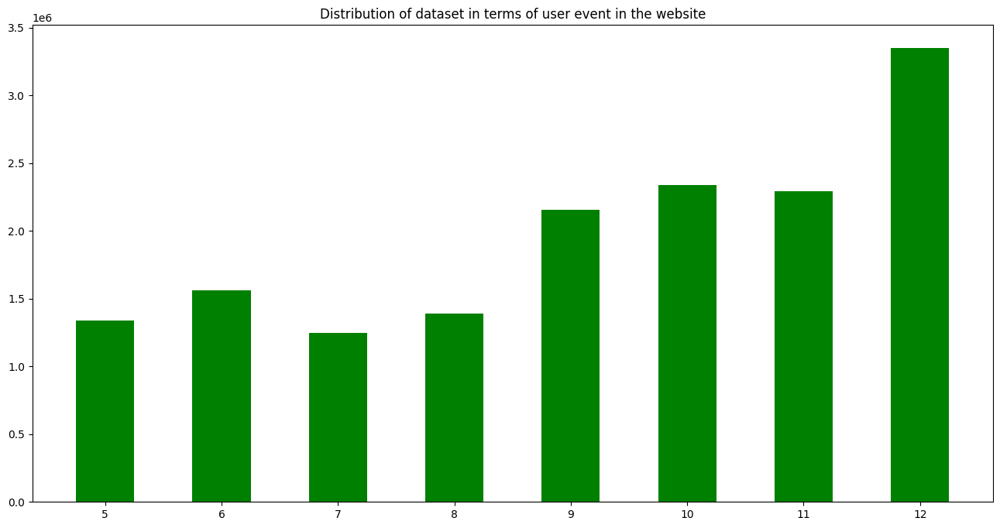

In [21]:
#Distribution of data over dataset
plt.figure(figsize = (16, 8))
plt.title(label = "Distribution of dataset in terms of user event in the website")
plt.bar(x, y, color = 'Green', width = 0.5)
plt.show()

It seems like the user interaction with websibe in terms of various activities increased and demonstrated th highest number of user event in th website in december 2021.

hit_date column contain excessively distinuishable variables which means there are huge number of unique values in this dataset. Hence when we engage in feature engineering activity, we would witness the problem with the number of columns. Therefore I have decided to replace the variable with the month of hit_date only, which will decrease our uniques values maximum 12 distinguishable variables.

In [22]:
total_dataframe["hit_date"] = total_dataframe["hit_date"].astype("datetime64[ns]").dt.month

hit_time - how much time user spent on the website for the purpose of the event

In [23]:
#hit_time analysis
total_dataframe['hit_time'].value_counts(dropna = False)

hit_time
NaN         9160203
0.0           40799
1.0           18471
2.0           10074
3.0            6043
             ...   
702527.0          1
660571.0          1
489898.0          1
519031.0          1
600274.0          1
Name: count, Length: 914612, dtype: int64

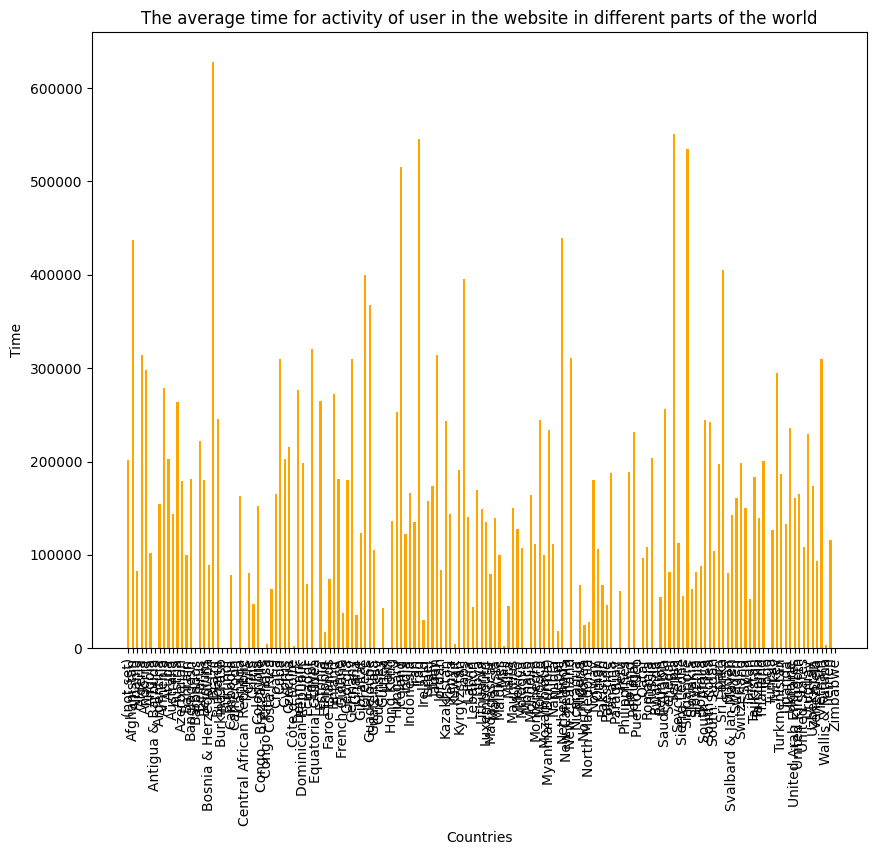

In [25]:
plt.figure(figsize = (10, 8))
plt.title(label = "The average time for activity of user in the website in different parts of the world")
plt.bar(height = x, x = y, color = 'Orange', width = 0.5)
plt.xticks(rotation = 90)
plt.xlabel(xlabel = 'Countries')
plt.ylabel(ylabel = 'Time')
plt.show()

It seems like the citizens of Bulgaria and Ireland spend most of their time with website compared to other the citizens of other countries.

In [26]:
y = np.array(total_dataframe['hit_time'].value_counts().values)
x =  np.array(total_dataframe['hit_date'].value_counts().index)

In [27]:
#Checking correlation of this column with target column
print(f"Correlation of hit_time column with target column is {total_dataframe['hit_time'].corr(total_dataframe['target_action']).__round__(2) * 100} %")

Correlation of hit_time column with target column is 3.0 %


The more than half of this column include empty values. If I replace these empty values in traditional way(like average values or the values which mostly occured in the dataset, it can be biased.) Moreover it has very little correlation with target column. Hence, I think two ways : dropping entire column and working with other columns, dropping the rows of the dataset with empty values.

I will do both of them, but firstly I am going to go with second option to test whether the problems of empty values are going to be resolved at the same time.

In [28]:
#total_dataframe.dropna(subset = ['hit_time'], inplace = True)

In [29]:
"""
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values
"""

'\nmissing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)\nprint("The percentage of missing values in the dataset : ")\nmissing_values\n'

I have analyzed dataset in another jupyter notebook. Cause after dropping some Nan values from the overall dataset, I have lost most values from hit_referer column. This colum would correlate with our target column the most compared to hit_time. 

After analyzing this in another jupyter notebook, I have just decided to remove hit_time column from the entire dataset, cause it's relation with target column is just about 0.03, while when I have tested correlation between event_action and hit_referer using cramer's V algorithm(the algorithm for checking correlation between categorical features), it just returned 0.27 correlation between them(which is considerably higher than hit_time). Hence I have just determined to remove hit_time from our dataset.

In [30]:
total_dataframe.drop(columns = ['hit_time'], inplace = True)
total_dataframe.head(5)

,session_id,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,client_id,visit_date,...,utm_adcontent,utm_keyword,device_category,device_os,device_brand,device_screen_resolution,device_browser,geo_country,geo_city,target_action
0,5639623078712724064.1640254056.1640254056,12,30,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,quiz,NaN,1313077071.164025,2021-12-23,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
1,5639623078712724064.1640254056.1640254056,12,12,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
2,5639623078712724064.1640254056.1640254056,12,18,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
3,5639623078712724064.1640254056.1640254056,12,20,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
4,5639623078712724064.1640254056.1640254056,12,8,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,wvtWRwiRmvPIsSQuXnvd,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0


In [31]:
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values

The percentage of missing values in the dataset : 


utm_keyword                 58.684721
device_os                   58.388614
hit_referer                 39.753975
device_brand                25.156646
event_label                 23.765572
utm_adcontent               18.057880
utm_campaign                14.018759
utm_source                   0.004463
geo_city                     0.000000
geo_country                  0.000000
device_browser               0.000000
device_screen_resolution     0.000000
device_category              0.000000
session_id                   0.000000
utm_medium                   0.000000
hit_date                     0.000000
visit_number                 0.000000
visit_time                   0.000000
visit_date                   0.000000
client_id                    0.000000
event_category               0.000000
hit_page_path                0.000000
hit_type                     0.000000
hit_number                   0.000000
target_action                0.000000
dtype: float64

When it comes to other two columns, I have also tried same algorithm in order to see correlation between two columns with higher number of empty values and our target column(event_action). Here is what I got :

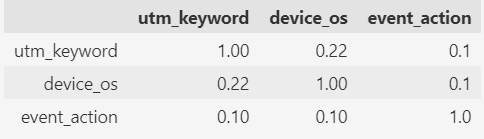

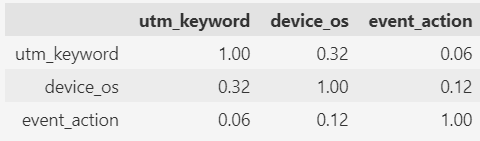

These cramers V metrics is measure for the first 140000 and last 140000 data from the dataset because of memory issues. From the metrics table, I can say there is not any relationship between the column utm_keyword and event_action, therefore I am going remove this column as well.

In [32]:
total_dataframe.drop(columns = ['utm_keyword'], inplace = True)
total_dataframe.head(5)

,session_id,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,client_id,visit_date,...,utm_campaign,utm_adcontent,device_category,device_os,device_brand,device_screen_resolution,device_browser,geo_country,geo_city,target_action
0,5639623078712724064.1640254056.1640254056,12,30,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,quiz,NaN,1313077071.164025,2021-12-23,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
1,5639623078712724064.1640254056.1640254056,12,12,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
2,5639623078712724064.1640254056.1640254056,12,18,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
3,5639623078712724064.1640254056.1640254056,12,20,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
4,5639623078712724064.1640254056.1640254056,12,8,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,1313077071.164025,2021-12-23,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0


I think there is not any correlaiton between client id and our target actions, therefore I have just removed them from our table

In [33]:
total_dataframe.drop(columns = ['client_id'], inplace = True)
total_dataframe.head(5)

,session_id,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,visit_date,visit_time,...,utm_campaign,utm_adcontent,device_category,device_os,device_brand,device_screen_resolution,device_browser,geo_country,geo_city,target_action
0,5639623078712724064.1640254056.1640254056,12,30,event,NaN,sberauto.com/cars?utm_source_initial=google&ut...,quiz,NaN,2021-12-23,13:07:36,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
1,5639623078712724064.1640254056.1640254056,12,12,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,2021-12-23,13:07:36,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
2,5639623078712724064.1640254056.1640254056,12,18,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,2021-12-23,13:07:36,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
3,5639623078712724064.1640254056.1640254056,12,20,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd...,card_web,NaN,2021-12-23,13:07:36,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0
4,5639623078712724064.1640254056.1640254056,12,8,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_...,card_web,NaN,2021-12-23,13:07:36,...,NaN,NaN,mobile,Android,Huawei,360x780,Chrome,Russia,Saint Petersburg,0


Finally I have tested out the correlations of categorical variable using Cramers V and got the results :
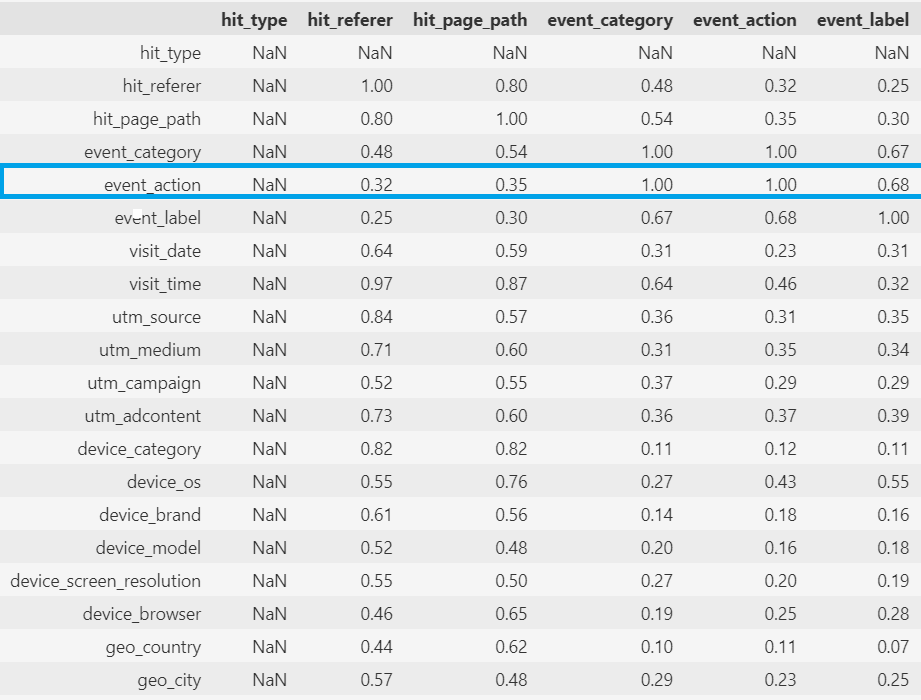

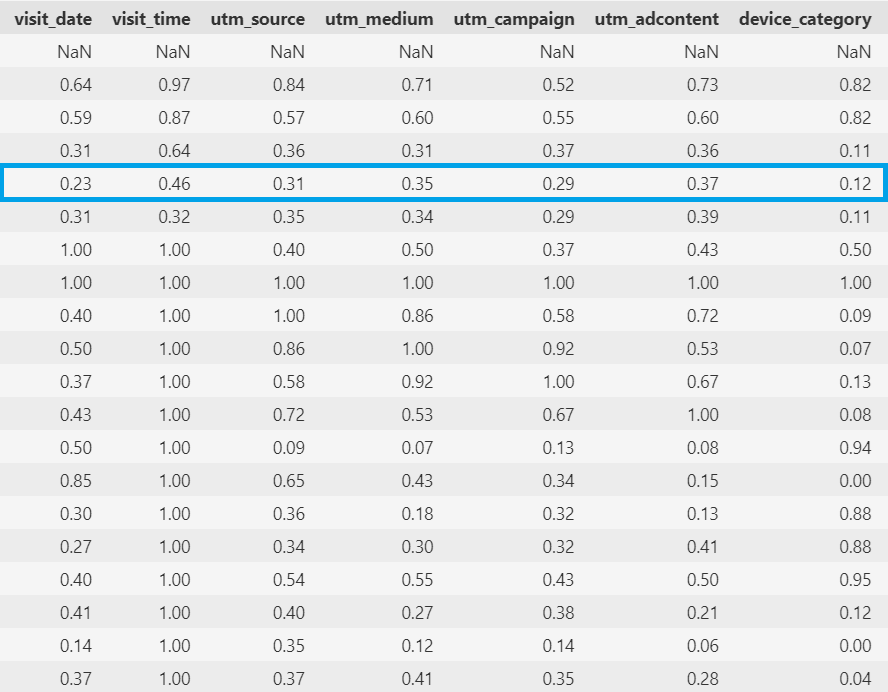

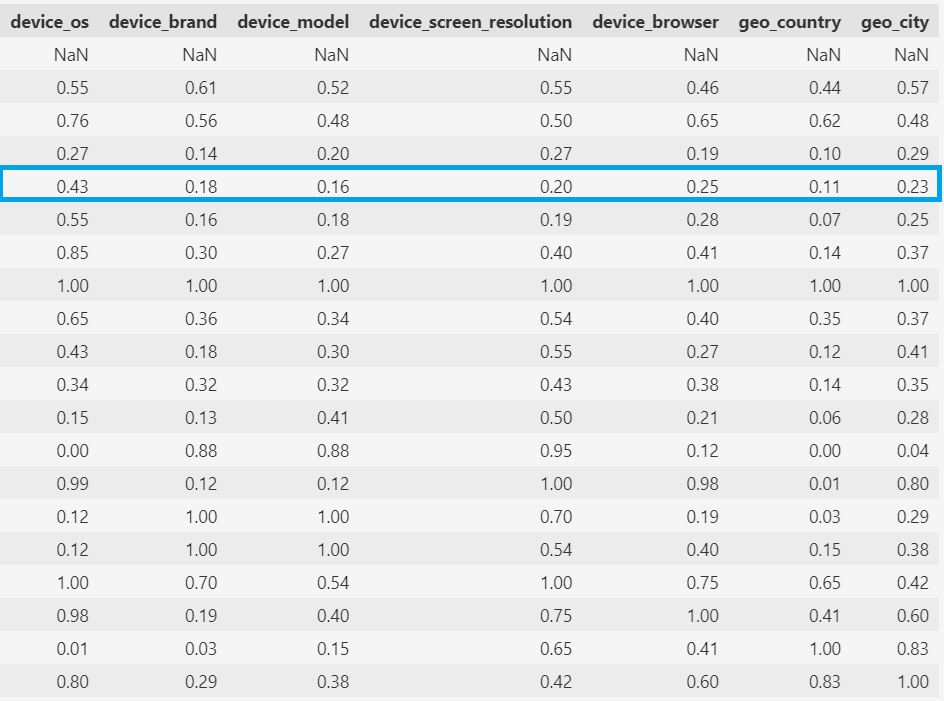

These table is for the last 140000 data rows :
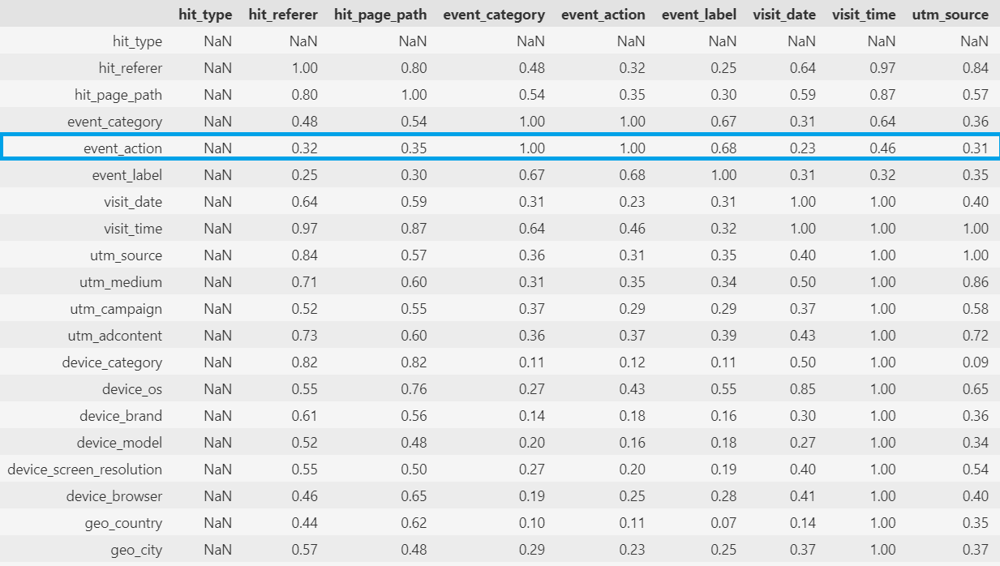

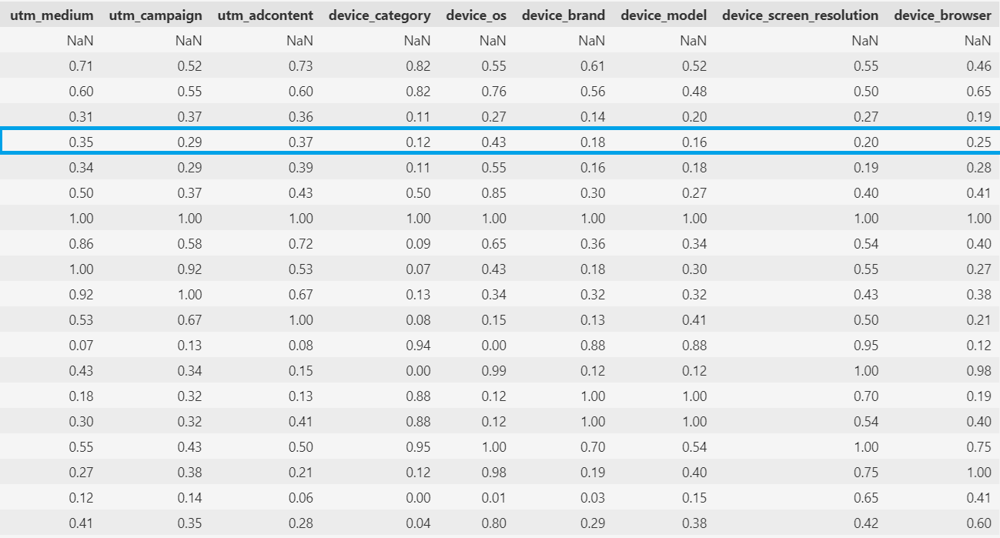

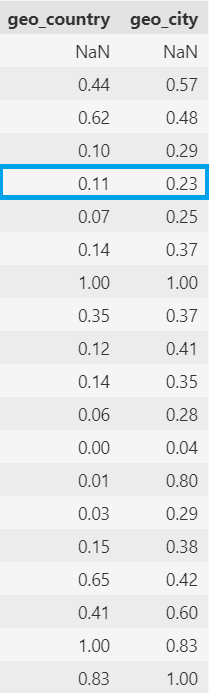

From these correlation matrix, I have decided to remove these columns from my dataset(columns which have a correlation with event-action which is smaller than 0.2) : device_category, device_brand, device_model, geo_country(But I think, it is worth to keep device_category and geo_country temporarily to test the performance of machine learning model two condition(with these columns and without these columns), Because, there is not any empty values in these columns.)

In [34]:
total_dataframe.drop(columns = ['device_brand'], inplace = True)
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values

The percentage of missing values in the dataset : 


device_os                   58.388614
hit_referer                 39.753975
event_label                 23.765572
utm_adcontent               18.057880
utm_campaign                14.018759
utm_source                   0.004463
utm_medium                   0.000000
geo_city                     0.000000
geo_country                  0.000000
device_browser               0.000000
device_screen_resolution     0.000000
device_category              0.000000
session_id                   0.000000
hit_date                     0.000000
visit_number                 0.000000
visit_time                   0.000000
visit_date                   0.000000
event_category               0.000000
hit_page_path                0.000000
hit_type                     0.000000
hit_number                   0.000000
target_action                0.000000
dtype: float64

The columns above are the pivotal data for training our model, but there are again empty values in some columns. In terms of device_os, hit_referer and event_label, there is not good strategy to fill up empty values. Cause the number of empty values in this columns is vast and filling up these values in traditional way can cause biased model to be produced. Therefore, I am going to remove the rows of these empty values as I have millions of data.

In [35]:
total_dataframe.shape

(15685219, 22)

In [36]:
total_dataframe.dropna(subset = ['device_os', 'hit_referer', 'event_label'], inplace = True)
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values

The percentage of missing values in the dataset : 


utm_adcontent               13.881905
utm_campaign                11.341714
utm_source                   0.006058
hit_date                     0.000000
geo_city                     0.000000
geo_country                  0.000000
device_browser               0.000000
device_screen_resolution     0.000000
device_os                    0.000000
device_category              0.000000
utm_medium                   0.000000
session_id                   0.000000
visit_number                 0.000000
visit_time                   0.000000
visit_date                   0.000000
event_label                  0.000000
event_category               0.000000
hit_page_path                0.000000
hit_referer                  0.000000
hit_type                     0.000000
hit_number                   0.000000
target_action                0.000000
dtype: float64

In [37]:
total_dataframe.shape

(231085, 22)

In [38]:
total_dataframe.head()

,session_id,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,visit_date,visit_time,...,utm_medium,utm_campaign,utm_adcontent,device_category,device_os,device_screen_resolution,device_browser,geo_country,geo_city,target_action
387,4024492994895054107.1640269084.1640269084,12,105,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,VppGBKuEPJVLSsOLERbm,2021-12-23,17:18:04,...,(none),LTuZkdKfxRGVceoWkVyg,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0
396,4024492994895054107.1640269084.1640269084,12,98,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,OHfyUfDKdPgBdvelDlfG,2021-12-23,17:18:04,...,(none),LTuZkdKfxRGVceoWkVyg,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0
456,555009234841130092.1640256620.1640256620,12,104,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,uDrwlhtkwJJbRcbyRaTW,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
461,555009234841130092.1640256620.1640256620,12,10,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,listing_ads,hAHqGICPFQiPwtzubOzs,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
462,555009234841130092.1640256620.1640256620,12,53,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,cars,pzAKUYdRKNEUXxxBFUPX,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0


In terms of utm_adcontent, utm_campaign, utm_source and utm_medium columns, I think there is a correlation and I can utilize this opportunity to fill up empty values in these columns.

In [39]:
total_dataframe[['utm_adcontent', 'utm_campaign', 'utm_source', 'utm_medium']]

,utm_adcontent,utm_campaign,utm_source,utm_medium
387,JNHcPlZPxEMWDnRiyoBf,LTuZkdKfxRGVceoWkVyg,fDLlAcSmythWSCVMvqvL,(none)
396,JNHcPlZPxEMWDnRiyoBf,LTuZkdKfxRGVceoWkVyg,fDLlAcSmythWSCVMvqvL,(none)
456,LLfCasrxQzJIyuldcuWy,okTXSMadDkjvntEHzIjp,vFcAhRxLfOWKhvxjELkx,organic
461,LLfCasrxQzJIyuldcuWy,okTXSMadDkjvntEHzIjp,vFcAhRxLfOWKhvxjELkx,organic
462,LLfCasrxQzJIyuldcuWy,okTXSMadDkjvntEHzIjp,vFcAhRxLfOWKhvxjELkx,organic
...,...,...,...,...
15684781,LLfCasrxQzJIyuldcuWy,okTXSMadDkjvntEHzIjp,vFcAhRxLfOWKhvxjELkx,organic
15684782,LLfCasrxQzJIyuldcuWy,okTXSMadDkjvntEHzIjp,vFcAhRxLfOWKhvxjELkx,organic
15684789,LLfCasrxQzJIyuldcuWy,okTXSMadDkjvntEHzIjp,vFcAhRxLfOWKhvxjELkx,organic
15684793,LLfCasrxQzJIyuldcuWy,okTXSMadDkjvntEHzIjp,vFcAhRxLfOWKhvxjELkx,organic


In [40]:
total_dataframe[['utm_adcontent', 'utm_campaign', 'utm_source', 'utm_medium']][total_dataframe['utm_adcontent'].isna()]

,utm_adcontent,utm_campaign,utm_source,utm_medium
1278,NaN,NaN,kjsLglQLzykiRbcDiGcD,cpc
1322,NaN,NaN,BHcvLfOaCWvWTykYqHVe,cpc
1830,NaN,NaN,BHcvLfOaCWvWTykYqHVe,cpc
2876,NaN,NaN,BHcvLfOaCWvWTykYqHVe,cpc
3043,NaN,LwJZxKuWmvOhPsaCeRjG,kjsLglQLzykiRbcDiGcD,cpc
...,...,...,...,...
15680216,NaN,labpJCBQmsoWLfQvNTak,kjsLglQLzykiRbcDiGcD,cpc
15680773,NaN,RoDitORHdzGfGhNCyEMy,kjsLglQLzykiRbcDiGcD,cpc
15681317,NaN,RoDitORHdzGfGhNCyEMy,kjsLglQLzykiRbcDiGcD,cpc
15681358,NaN,bJJuEXRheRIxXEaYIXqM,kjsLglQLzykiRbcDiGcD,cpc


In [41]:
total_dataframe[['utm_adcontent', 'utm_campaign', 'utm_source', 'utm_medium']][total_dataframe['utm_campaign'].isna()]

,utm_adcontent,utm_campaign,utm_source,utm_medium
1278,NaN,NaN,kjsLglQLzykiRbcDiGcD,cpc
1322,NaN,NaN,BHcvLfOaCWvWTykYqHVe,cpc
1830,NaN,NaN,BHcvLfOaCWvWTykYqHVe,cpc
2876,NaN,NaN,BHcvLfOaCWvWTykYqHVe,cpc
3026,JNHcPlZPxEMWDnRiyoBf,NaN,QxAxdyPLuQMEcrdZWdWb,cpc
...,...,...,...,...
15662495,JNHcPlZPxEMWDnRiyoBf,NaN,ISrKoXQCxqqYvAZICvjs,smm
15662496,JNHcPlZPxEMWDnRiyoBf,NaN,ISrKoXQCxqqYvAZICvjs,smm
15665996,JNHcPlZPxEMWDnRiyoBf,NaN,ISrKoXQCxqqYvAZICvjs,smm
15670005,NaN,NaN,BHcvLfOaCWvWTykYqHVe,cpc


In [42]:
total_dataframe[['utm_adcontent', 'utm_campaign', 'utm_source', 'utm_medium']][total_dataframe['utm_source'].isna()]

,utm_adcontent,utm_campaign,utm_source,utm_medium
1464126,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
1464129,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
1464136,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
1464140,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
1899628,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
1899632,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
3327871,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
3327889,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
3574866,NaN,IKQsApKuPmZqqmhieEgf,NaN,CPM
4123639,JNHcPlZPxEMWDnRiyoBf,LTuZkdKfxRGVceoWkVyg,NaN,(not set)


Correlation matrix of utm_source, utm_campaign, utm_adcontent, utm_medium :

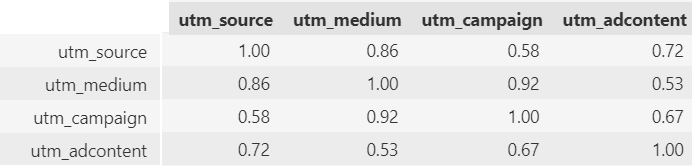

I am going to fill up whole NAN values according to utm_medium column's data as it is the only column which has a significant correlation with other columns and it doesn't have any empty values

In [43]:
#The data array for filling up empty values in utm_source column
utm_source_fill = total_dataframe.groupby(['utm_medium'])['utm_source'].value_counts().groupby(level = 0).nlargest(1).index

medium_col = []
source_col = []

for i in utm_source_fill:
    medium_col.append(i[1])
    source_col.append(i[2])

print(total_dataframe['utm_source'].isna().sum())

medium_to_source_map = dict(zip(medium_col, source_col))
total_dataframe['utm_source'].fillna(total_dataframe['utm_medium'].map(medium_to_source_map), inplace = True)

print(total_dataframe['utm_source'].isna().sum())

14
13


In [44]:
#Same process for filling up empty values 
utm_campaign_fill = total_dataframe.groupby(['utm_medium'])['utm_campaign'].value_counts().groupby(level = 0).nlargest(1).index

medium_col = []
campaign_col = []

for i in utm_campaign_fill:
    medium_col.append(i[1])
    campaign_col.append(i[2])

print(total_dataframe['utm_campaign'].isna().sum())

medium_to_campaign_map = dict(zip(medium_col, campaign_col))
total_dataframe['utm_campaign'].fillna(total_dataframe['utm_medium'].map(medium_to_campaign_map), inplace = True)

print(total_dataframe['utm_campaign'].isna().sum())

26209
736


In [45]:
utm_adcontent_fill = total_dataframe.groupby(['utm_medium'])['utm_adcontent'].value_counts().groupby(level = 0).nlargest(1).index

medium_col = []
adcontent_col = []

for i in utm_adcontent_fill:
    medium_col.append(i[1])
    adcontent_col.append(i[2])
    
print(total_dataframe['utm_adcontent'].isna().sum())

medium_to_adcontent_map = dict(zip(medium_col, adcontent_col))
total_dataframe['utm_adcontent'].fillna(total_dataframe['utm_medium'].map(medium_to_adcontent_map), inplace = True)

print(total_dataframe['utm_adcontent'].isna().sum())

32079
15


After accomplishing my strategy to given dataset and variables, some piece of data remained empty. Since the amount of remnant data in our tremendous dataset is not considerable, I have determined to remove these data from my dataset.

In [46]:
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values

The percentage of missing values in the dataset : 


utm_campaign                0.318498
utm_adcontent               0.006491
utm_source                  0.005626
hit_date                    0.000000
geo_city                    0.000000
geo_country                 0.000000
device_browser              0.000000
device_screen_resolution    0.000000
device_os                   0.000000
device_category             0.000000
utm_medium                  0.000000
session_id                  0.000000
visit_number                0.000000
visit_time                  0.000000
visit_date                  0.000000
event_label                 0.000000
event_category              0.000000
hit_page_path               0.000000
hit_referer                 0.000000
hit_type                    0.000000
hit_number                  0.000000
target_action               0.000000
dtype: float64

In [47]:
total_dataframe.dropna(inplace = True)

In [48]:
total_dataframe.shape

(230334, 22)

In [49]:
missing_values = (total_dataframe.isna().sum()/len(total_dataframe) * 100).sort_values(ascending = False)
print("The percentage of missing values in the dataset : ")
missing_values

The percentage of missing values in the dataset : 


session_id                  0.0
hit_date                    0.0
geo_city                    0.0
geo_country                 0.0
device_browser              0.0
device_screen_resolution    0.0
device_os                   0.0
device_category             0.0
utm_adcontent               0.0
utm_campaign                0.0
utm_medium                  0.0
utm_source                  0.0
visit_number                0.0
visit_time                  0.0
visit_date                  0.0
event_label                 0.0
event_category              0.0
hit_page_path               0.0
hit_referer                 0.0
hit_type                    0.0
hit_number                  0.0
target_action               0.0
dtype: float64

In [50]:
total_dataframe.head(10)

,session_id,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,visit_date,visit_time,...,utm_medium,utm_campaign,utm_adcontent,device_category,device_os,device_screen_resolution,device_browser,geo_country,geo_city,target_action
387,4024492994895054107.1640269084.1640269084,12,105,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,VppGBKuEPJVLSsOLERbm,2021-12-23,17:18:04,...,(none),LTuZkdKfxRGVceoWkVyg,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0
396,4024492994895054107.1640269084.1640269084,12,98,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,OHfyUfDKdPgBdvelDlfG,2021-12-23,17:18:04,...,(none),LTuZkdKfxRGVceoWkVyg,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0
456,555009234841130092.1640256620.1640256620,12,104,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,uDrwlhtkwJJbRcbyRaTW,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
461,555009234841130092.1640256620.1640256620,12,10,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,listing_ads,hAHqGICPFQiPwtzubOzs,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
462,555009234841130092.1640256620.1640256620,12,53,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,cars,pzAKUYdRKNEUXxxBFUPX,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
465,555009234841130092.1640256620.1640256620,12,73,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,auth,laGwZrsmhPBUTfmuxIBJ,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
467,555009234841130092.1640256620.1640256620,12,59,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,auth,sfCemwVzPyhiUBVuawDb,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
468,555009234841130092.1640256620.1640256620,12,56,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,cMCEFfSnnlNHXnIdruks,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
469,555009234841130092.1640256620.1640256620,12,118,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,uDrwlhtkwJJbRcbyRaTW,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
475,555009234841130092.1640256620.1640256620,12,109,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,listing_ads,hAHqGICPFQiPwtzubOzs,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0


In [51]:
#Droppping duplicate values from total_dataframe 
total_dataframe.drop_duplicates(inplace = True)

In [56]:
total_dataframe.to_csv("./data/cleaned_data.csv", sep = ",", index = False)
print("Cleaned dataframe is preserved in cleaned_data.csv file")

Cleaned dataframe is preserved in cleaned_data.csv file


Here our data cleaning process is completed ultimately, I think remaining data is adequate to create machine learning model for business purpose. 

While I was analyzing the dataset in terms of 

In [52]:
#Analysis of screen resolution and making them more understandable for us and our model
print(f"The number of unique values in screen resolution is : {total_dataframe['device_screen_resolution'].nunique()}")
print(f"Unique values of screen_resolution column : {total_dataframe['device_screen_resolution'].value_counts()}")

The number of unique values in screen resolution is : 715
Unique values of screen_resolution column : device_screen_resolution
1920x1080    35163
414x896      12773
393x851      11483
1536x864     11183
360x780       9272
             ...  
2170x1221        1
427x939          1
412x1005         1
412x912          1
360x661          1
Name: count, Length: 715, dtype: int64


In [53]:
total_dataframe.columns

Index(['session_id', 'hit_date', 'hit_number', 'hit_type', 'hit_referer',
       'hit_page_path', 'event_category', 'event_label', 'visit_date',
       'visit_time', 'visit_number', 'utm_source', 'utm_medium',
       'utm_campaign', 'utm_adcontent', 'device_category', 'device_os',
       'device_screen_resolution', 'device_browser', 'geo_country', 'geo_city',
       'target_action'],
      dtype='object')

Data Analysis hyphothesises and questions to answer :

1) Organic traffic is no different from paid traiffic in terms of Conversion Rate(CR) to target events

2) Traffic from mobile devices is no different from traffic from desktop devices in terms of CR(Conversion Rate) into target events

3) Traffic from cities of presence(Moscow and region St. Petersburg) does not differ from traffic from other regions in terms of CR(Conversion Rate) to target events

4) From which source/campaigns/devices/locations does the most targeted traffic come to us(both in terms of traffic volume and in terms of view CR)?

5)Which cars are in the greatest demand? Which cars have the best CR(Conversion Rate) for targeted events?

6)Should we increase our presense on social networks and advertise there more?

In [2]:
analyze_data = pd.read_csv(filepath_or_buffer = "./data/cleaned_data.csv", sep = ",")
analyze_data.head()

,session_id,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,visit_date,visit_time,...,utm_medium,utm_campaign,utm_adcontent,device_category,device_os,device_screen_resolution,device_browser,geo_country,geo_city,target_action
0,4024492994895054107.1640269084.1640269084,12,105,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,VppGBKuEPJVLSsOLERbm,2021-12-23,17:18:04,...,(none),LTuZkdKfxRGVceoWkVyg,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0
1,4024492994895054107.1640269084.1640269084,12,98,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,OHfyUfDKdPgBdvelDlfG,2021-12-23,17:18:04,...,(none),LTuZkdKfxRGVceoWkVyg,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0
2,555009234841130092.1640256620.1640256620,12,104,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,uDrwlhtkwJJbRcbyRaTW,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
3,555009234841130092.1640256620.1640256620,12,10,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,listing_ads,hAHqGICPFQiPwtzubOzs,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0
4,555009234841130092.1640256620.1640256620,12,53,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,cars,pzAKUYdRKNEUXxxBFUPX,2021-12-23,13:50:20,...,organic,okTXSMadDkjvntEHzIjp,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0


First hyphothesis analysis : Organic traffic is no different from paid traffic in terms of Conversion Rate(CR) to target events

NULL hyphothesis : Organic traffic is no different from paid traffic in terms of Conversion Rate(CR) to target events

Alternative hyphothesis : Organic traffic is distinct from paid traffic in terms of Conversion Rate(CR) to target events.

In [3]:
#Calculating conversion rates for both organic and paid traffic
organic_data = analyze_data[analyze_data['utm_medium'] == 'organic']
paid_data = analyze_data[analyze_data['utm_medium'] != 'organic']

#Conversion rates 
p_org = organic_data['target_action'].mean()
p_paid = paid_data['target_action'].mean()

n_org = organic_data.shape[0]
n_paid = paid_data.shape[0]

x_org = organic_data['target_action'].sum()
x_paid = organic_data['target_action'].sum()

# Pooled conversion rate
p_pooled = (x_org + x_paid) / (n_org + n_paid)

# Standard error
se = np.sqrt(p_pooled * (1 - p_pooled) * (1/n_org + 1/n_paid))

#z_score value 
z = (p_org - p_paid) / se

p_value = 2 * stats.norm.sf(abs(z))

print(f"For given hyphothesis, the value of p_value is equal to : {p_value}")

For given hyphothesis, the value of p_value is equal to : 0.0


After doing some research on the internet and reading some kaggle notebooks, I decided to check if the hyphothesis is correct or not using z_score value. z_score value indicates the deviation rate of the particular number in the row from the average value. It is actually the subtraction of these values divided by standart deviation.

As the p_value for my hyphothesis is lower than 0.05, my alternative hyphothesis is correct. Which means :

"Organic traffic is distinguishable from paid traffic in terms of conversion rate"

Second hyphothesis analysis : Traffic from mobile devices is not different from the traffic from desktop devices.

Null hyphothesis : Traffic from mobile devices is not distinguishable from thee traffic from desktop devices.

Alternative hyphothesis : Traffic from mobile devices is distinguishable from thee traffic from desktop devices.

In [4]:
analyze_data['device_category'].value_counts()

device_category
mobile     133264
desktop     91673
tablet       4308
Name: count, dtype: int64

In [5]:
#Calculating conversion rates for both mobile and desktop devices
mobile_data = analyze_data[analyze_data['device_category'] == 'mobile']
desktop_data = analyze_data[analyze_data['device_category'] == 'desktop']

#Conversion rates 
p_mobile = mobile_data['target_action'].mean()
p_desktop = desktop_data['target_action'].mean()

n_mobile = mobile_data.shape[0]
n_desktop = desktop_data.shape[0]

x_mobile = mobile_data['target_action'].sum()
x_desktop = desktop_data['target_action'].sum()

# Pooled conversion rate
p_pooled = (x_mobile + x_desktop) / (n_mobile + n_desktop)

# Standard error
se = np.sqrt(p_pooled * (1 - p_pooled) * (1/n_mobile + 1/n_desktop))

#z_score value 
z = (p_mobile - p_desktop) / se

p_value = 2 * stats.norm.sf(abs(z))

print(f"For given hyphothesis, the value of p_value is equal to : {p_value}")

For given hyphothesis, the value of p_value is equal to : 1.6050830412715395e-07


The p_value for given hyphothesis is far less than 0.05, which means our alternative hyphothesis is correct. That means :

Traffic from the mobile devices is distinct from desktop devices.

Third hyphothesis analysis : Traffic from Moscow and St. Petersburg is not different from each other.

NULL hyphothesis : Traffic from Moscow and St. Petersburg is not different from each other.

Alternative hyphothesis : Traffic from Moscow and St. Petersburg is different from each other

In [6]:
#Calculating conversion rates for both mobile and desktop devices
moscow_data = analyze_data[analyze_data['geo_city'] == 'Moscow']
petersburg_data = analyze_data[analyze_data['geo_city'] == 'Saint Petersburg']

#Conversion rates 
p_moscow = moscow_data['target_action'].mean()
p_petersburg = petersburg_data['target_action'].mean()

n_moscow = moscow_data.shape[0]
n_petersburg = petersburg_data.shape[0]

x_moscow = moscow_data['target_action'].sum()
x_petersburg = petersburg_data['target_action'].sum()

# Pooled conversion rate
p_pooled = (x_moscow + x_petersburg) / (n_moscow + n_petersburg)

# Standard error
se = np.sqrt(p_pooled * (1 - p_pooled) * (1/n_moscow + 1/n_petersburg))

#z_score value 
z = (p_moscow - p_petersburg) / se

p_value = 2 * stats.norm.sf(abs(z))

print(f"For given hyphothesis, the value of p_value is equal to : {p_value}")

For given hyphothesis, the value of p_value is equal to : 1.0765068198673037e-21


Because the p_value is considerably lower than 0.05, our alternative hyphothesis is correct which means "Traffic from Moscow and St. Petersburg is different from each other"

Analysis of data for fourth question :
 
    "From which source the most traffic and views come?"

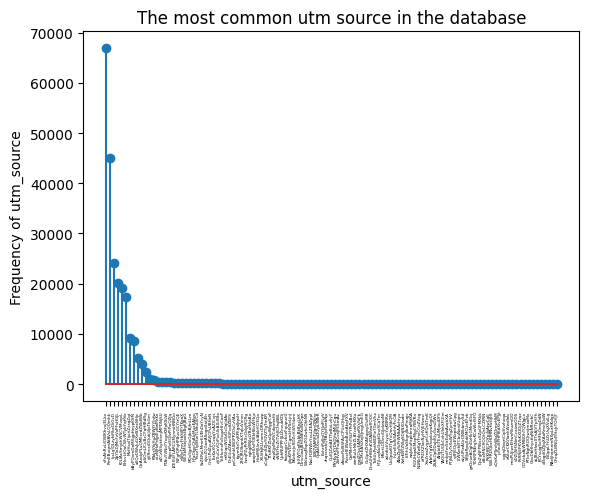

In [7]:
x = analyze_data['utm_source'].value_counts().index
y = analyze_data['utm_source'].value_counts().values

fig, ax = plt.subplots()
plt.title(label = "The most common utm source in the database")
plt.xlabel(xlabel = "utm_source")
plt.ylabel(ylabel = 'Frequency of utm_source')
ax.stem(x, y)
plt.xticks(rotation=90, fontsize=3)
plt.show()

In [8]:
print(f"The most common utm source in the database is : {analyze_data['utm_source'].value_counts().index[0]}")

The most common utm source in the database is : vFcAhRxLfOWKhvxjELkx


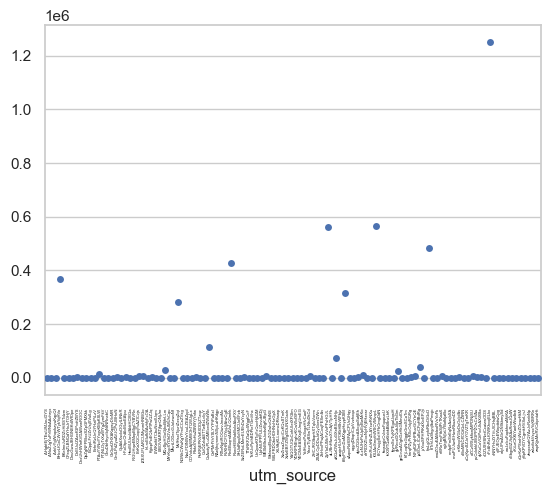

In [9]:
df_temp = pd.DataFrame(data = analyze_data.groupby(by = 'utm_source')['hit_number'].sum().values, index = analyze_data.groupby(by = 'utm_source')['hit_number'].sum().index)

sns.set(style = 'whitegrid') 
sns.stripplot(x = df_temp.index, y = df_temp[0].values)
plt.xticks(rotation=90, fontsize=3)
plt.show()

In [10]:
print(f"The most common utm source in terms of hit number is : {analyze_data.groupby(by = 'utm_source')['hit_number'].sum().sort_values(ascending = False).index[0]}")

The most common utm source in terms of hit number is : vFcAhRxLfOWKhvxjELkx


Answering the next question of fourth questions :
 
    From which campaign the most traffic come in terms of view?

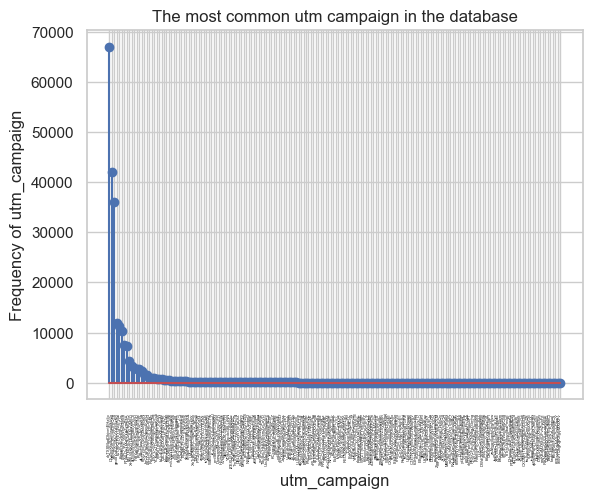

In [11]:
x = analyze_data['utm_campaign'].value_counts().index
y = analyze_data['utm_campaign'].value_counts().values

fig, ax = plt.subplots()
plt.title(label = "The most common utm campaign in the database")
plt.xlabel(xlabel = "utm_campaign")
plt.ylabel(ylabel = 'Frequency of utm_campaign')
ax.stem(x, y)
plt.xticks(rotation=90, fontsize=3)
plt.show()

In [12]:
print(f"The most common utm source in the database is : {analyze_data['utm_campaign'].value_counts().index[0]}")

The most common utm source in the database is : okTXSMadDkjvntEHzIjp


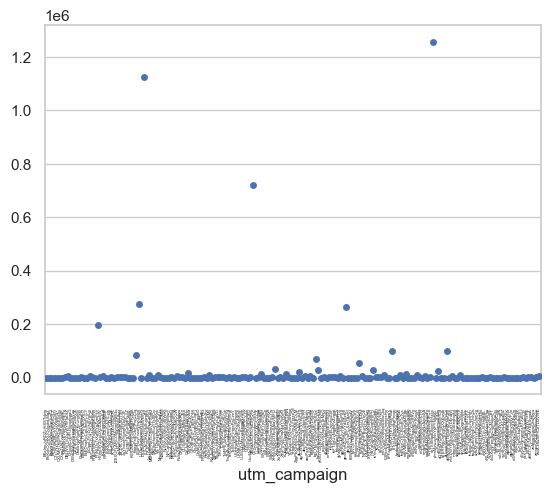

In [13]:
df_temp = pd.DataFrame(data = analyze_data.groupby(by = 'utm_campaign')['hit_number'].sum().values, index = analyze_data.groupby(by = 'utm_campaign')['hit_number'].sum().index)

sns.set(style = 'whitegrid') 
sns.stripplot(x = df_temp.index, y = df_temp[0].values)
plt.xticks(rotation=90, fontsize=3)
plt.show()

In [14]:
print(f"The most common utm source in terms of hit number is : {analyze_data.groupby(by = 'utm_campaign')['hit_number'].sum().sort_values(ascending = False).index[0]}")

The most common utm source in terms of hit number is : okTXSMadDkjvntEHzIjp


Answering the next question of fourth question list : 

    From which devices the most traffic and views come from?

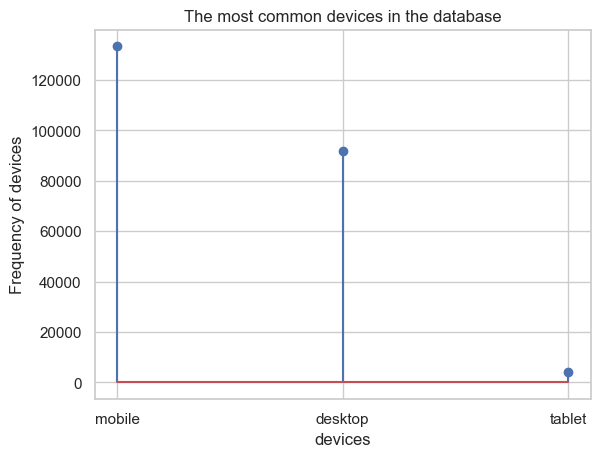

In [15]:
x = analyze_data['device_category'].value_counts().index
y = analyze_data['device_category'].value_counts().values

fig, ax = plt.subplots()
plt.title(label = "The most common devices in the database")
plt.xlabel(xlabel = "devices")
plt.ylabel(ylabel = 'Frequency of devices')
ax.stem(x, y)
plt.show()

In [16]:
print(f"The most common devices in the database is : {analyze_data['device_category'].value_counts().index[0]}")

The most common devices in the database is : mobile


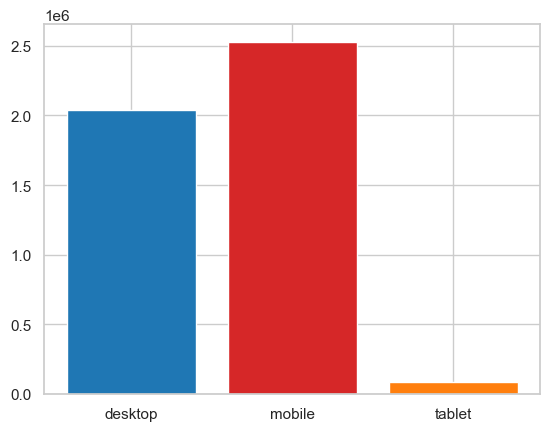

In [17]:
df_temp = pd.DataFrame(data = analyze_data.groupby(by = 'device_category')['hit_number'].sum().values, index = analyze_data.groupby(by = 'device_category')['hit_number'].sum().index)

bar_labels = ['blue', '_red', 'orange']
bar_colors = ['tab:blue', 'tab:red', 'tab:orange']

sns.set(style = 'whitegrid') 
plt.bar(x = df_temp.index, height= df_temp[0].values, label = bar_labels, color = bar_colors)

plt.show()

In [18]:
print(f"The most common devices in terms of hit number is : {analyze_data.groupby(by = 'device_category')['hit_number'].sum().sort_values(ascending = False).index[0]}")

The most common devices in terms of hit number is : mobile


Answering the next question of fourth question list 

    From which locations does the most traffic and views come?


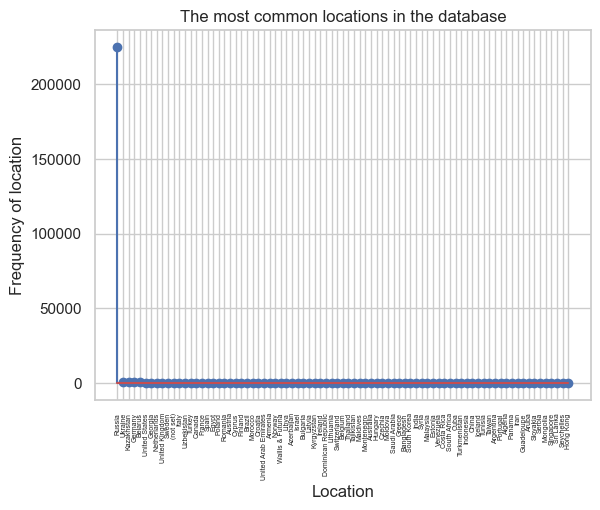

In [19]:
x = analyze_data['geo_country'].value_counts().index
y = analyze_data['geo_country'].value_counts().values

fig, ax = plt.subplots()
plt.title(label = "The most common locations in the database")
plt.xlabel(xlabel = "Location")
plt.ylabel(ylabel = 'Frequency of location')
ax.stem(x, y)
plt.xticks(rotation=90, fontsize=5)
plt.show()

In [20]:
print(f"The most common country in the database is : {analyze_data['geo_country'].value_counts().index[0]}")

The most common country in the database is : Russia


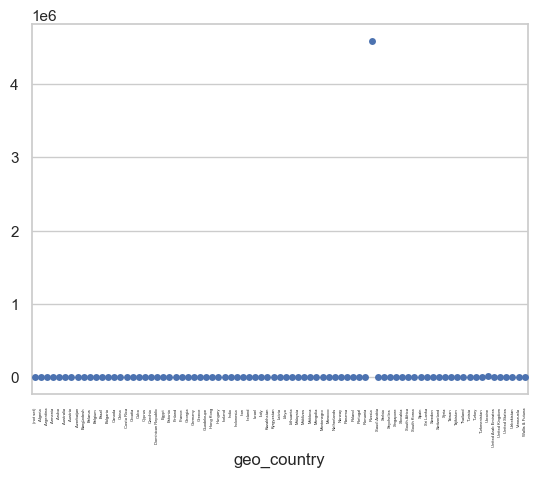

In [21]:
df_temp = pd.DataFrame(data = analyze_data.groupby(by = 'geo_country')['hit_number'].sum().values, index = analyze_data.groupby(by = 'geo_country')['hit_number'].sum().index)

sns.set(style = 'whitegrid') 
sns.stripplot(x = df_temp.index, y = df_temp[0].values)
plt.xticks(rotation=90, fontsize=3)
plt.show()

In [22]:
print(f"The most common country in terms of hit number is : {analyze_data.groupby(by = 'geo_country')['hit_number'].sum().sort_values(ascending = False).index[0]}")

The most common country in terms of hit number is : Russia


Question 5: 

    5)Which cars are in the greatest demand? Which cars have the best CR(Conversion Rate) for targeted events?    

In [23]:
cars = analyze_data[(analyze_data.hit_page_path.str.contains(r'\bsberauto.com/cars/all')) | analyze_data.hit_page_path.str.contains(r'\bsberauto-team.com/cars/all')]
analyze_data['car_manufacturer'] = cars.hit_page_path.apply(lambda x : x.split('/')[3])
analyze_data['car_model'] = cars.hit_page_path.apply(lambda x : x.split('/')[4])

In [24]:
len(analyze_data)

229245

In [25]:
analyze_data['car_manufacturer'].isna().sum()

227487

This question cannot be answered using cleaned data. Because, when we consider the size of the cleaner data, it only contains 229245 rows of dataset, but when we extract the model of the car from overall dataset, we can see 227487 empty values in the column which contains the information about the model of the car. So I am going to analyze it in the other jupyter notebook.(Name of the notebook : individual_analysis_3.ipynb)

I have analyzed the dataset for this questions and got the results like these : 

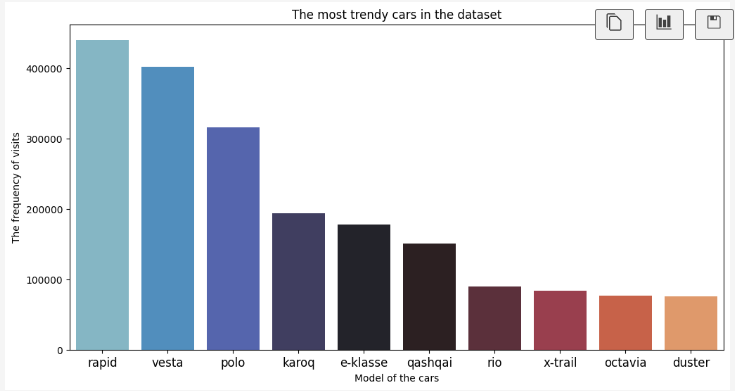 

Conclusion : The most trendy car model is rapid

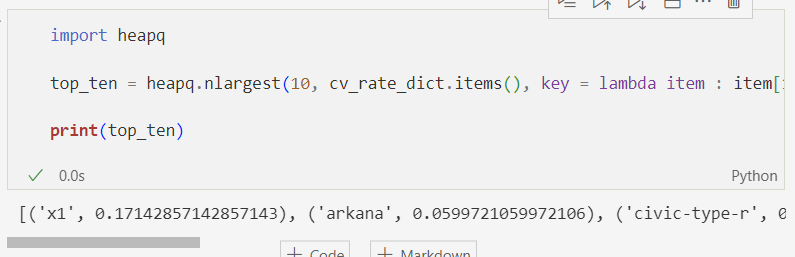 

Conclusion : X1 have the greatest conversion rate to target events

For further information : individual_analysis_3.ipynb

Sixth question : 

    Should we increase our presence on social media and advertise there more?

    Total analysis for this question is included in jupyter notebook named as individual_analysis_4.ipynb.

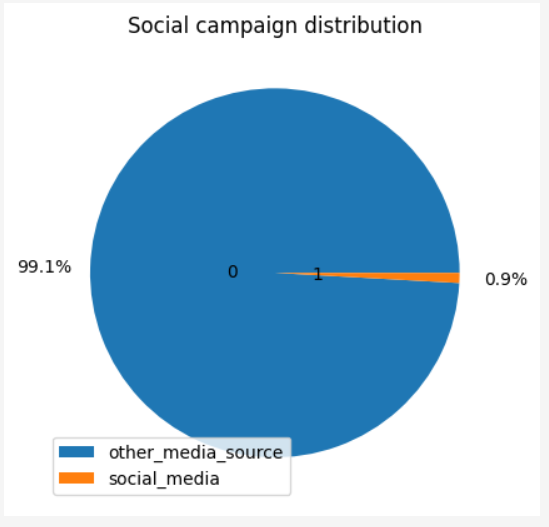

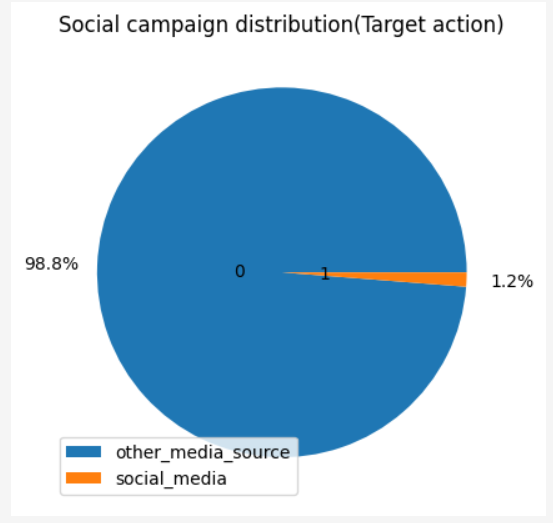

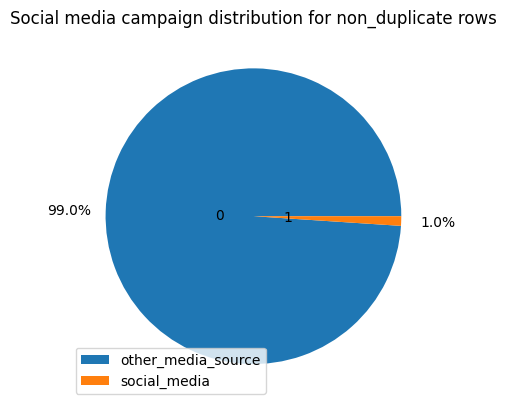

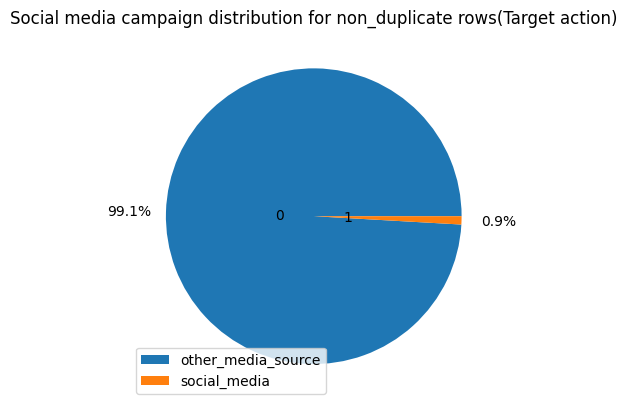

Conclusion : I assume that Sberbankauto doesn't have to improve it's campaign in social media as the contribution of social nets is not such huge generally. It is better to invest financial resources to more profitable ways rather than social media campaigns.

Feature engineering process

In [27]:
analyze_data.head(10)

,session_id,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_category,event_label,visit_date,visit_time,...,utm_adcontent,device_category,device_os,device_screen_resolution,device_browser,geo_country,geo_city,target_action,car_manufacturer,car_model
0,4024492994895054107.1640269084.1640269084,12,105,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,VppGBKuEPJVLSsOLERbm,2021-12-23,17:18:04,...,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0,NaN,NaN
1,4024492994895054107.1640269084.1640269084,12,98,event,FwdMTcXzWAwhtsnMAbhS,podpiska.sberauto.com/,sub_button_click,OHfyUfDKdPgBdvelDlfG,2021-12-23,17:18:04,...,JNHcPlZPxEMWDnRiyoBf,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0,NaN,NaN
2,555009234841130092.1640256620.1640256620,12,104,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,uDrwlhtkwJJbRcbyRaTW,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN
3,555009234841130092.1640256620.1640256620,12,10,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,listing_ads,hAHqGICPFQiPwtzubOzs,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN
4,555009234841130092.1640256620.1640256620,12,53,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,cars,pzAKUYdRKNEUXxxBFUPX,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN
5,555009234841130092.1640256620.1640256620,12,73,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,auth,laGwZrsmhPBUTfmuxIBJ,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN
6,555009234841130092.1640256620.1640256620,12,59,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,auth,sfCemwVzPyhiUBVuawDb,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN
7,555009234841130092.1640256620.1640256620,12,56,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,cMCEFfSnnlNHXnIdruks,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN
8,555009234841130092.1640256620.1640256620,12,118,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,chat,uDrwlhtkwJJbRcbyRaTW,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN
9,555009234841130092.1640256620.1640256620,12,109,event,VloVXNWduHeTjUoDkjkO,sberauto.com/cars?yzclid=6771251748358633377&r...,listing_ads,hAHqGICPFQiPwtzubOzs,2021-12-23,13:50:20,...,LLfCasrxQzJIyuldcuWy,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN


In [28]:
analyze_data.columns

Index(['session_id', 'hit_date', 'hit_number', 'hit_type', 'hit_referer',
       'hit_page_path', 'event_category', 'event_label', 'visit_date',
       'visit_time', 'visit_number', 'utm_source', 'utm_medium',
       'utm_campaign', 'utm_adcontent', 'device_category', 'device_os',
       'device_screen_resolution', 'device_browser', 'geo_country', 'geo_city',
       'target_action', 'car_manufacturer', 'car_model'],
      dtype='object')

In [29]:
for i in analyze_data.columns:
    print(f"There are {analyze_data[i].nunique()} unique values in the {i} column of the dataset")

There are 55171 unique values in the session_id column of the dataset
There are 4 unique values in the hit_date column of the dataset
There are 486 unique values in the hit_number column of the dataset
There are 1 unique values in the hit_type column of the dataset
There are 14243 unique values in the hit_referer column of the dataset
There are 20348 unique values in the hit_page_path column of the dataset
There are 28 unique values in the event_category column of the dataset
There are 3246 unique values in the event_label column of the dataset
There are 73 unique values in the visit_date column of the dataset
There are 38654 unique values in the visit_time column of the dataset
There are 411 unique values in the visit_number column of the dataset
There are 113 unique values in the utm_source column of the dataset
There are 26 unique values in the utm_medium column of the dataset
There are 182 unique values in the utm_campaign column of the dataset
There are 91 unique values in the utm

It seems like we are not ready for feature engineering, we have to replace the values of some columns with understandable and related data in order to diminish the number of unique values.

In [30]:
#Diminishing the number of unique values in hit_page_path column 
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(analyze_data['hit_page_path'])

#Applying KMeans clustering for the purpose of diminishing the size of unique values 
n_clusters = 200 
kmeans = KMeans(n_clusters = n_clusters, random_state = 42)
analyze_data['cluster'] = kmeans.fit_predict(X)

analyze_data['cluster']

0          0
1          0
2          3
3          3
4          3
          ..
229240     3
229241     3
229242    96
229243    96
229244     0
Name: cluster, Length: 229245, dtype: int32

In [31]:
for cluster_num in range(n_clusters):
    print(f"Cluster {cluster_num}:")
    print(analyze_data[analyze_data['cluster'] == cluster_num]['hit_page_path'].values)
    print()

Cluster 0:
['podpiska.sberauto.com/' 'podpiska.sberauto.com/'
 'podpiska.sberauto.com/' ... 'podpiska.sberauto.com/'
 'podpiska.sberauto.com/' 'podpiska.sberauto.com/']

Cluster 1:
['sberauto.com/cars/bfc21661?rental_page=rental_car'
 'sberauto.com/cars/bfc21661?rental_page=rental_car'
 'sberauto.com/cars/bfc21661?rental_page=rental_car' ...
 'sberauto.com/cars/bfc21661?rental_page=rental_car'
 'sberauto.com/cars/bfc21661?rental_page=rental_car'
 'sberauto.com/cars/bfc21661?rental_page=rental_car']

Cluster 2:
['sberauto.com/cars?city=1&rental_page=rental_only&rental_car=rental_only&city=18'
 'sberauto.com/cars?city=1&rental_page=rental_only&rental_car=rental_only&city=18'
 'sberauto.com/cars?city=1&rental_page=rental_only&rental_car=rental_only&city=18'
 ...
 'sberauto.com/cars?city=1&rental_page=rental_only&rental_car=rental_only&city=18'
 'sberauto.com/cars?city=1&rental_page=rental_only&rental_car=rental_only&city=18'
 'sberauto.com/cars?city=1&rental_page=rental_only&rental_car=re

In [32]:
cluster_labels = {}
for cluster_num in range(n_clusters):
    cluster_labels[cluster_num] = analyze_data[analyze_data['cluster'] == cluster_num]['hit_page_path'].values[0] 

analyze_data['label'] = analyze_data['cluster'].map(cluster_labels)
analyze_data.drop(['cluster', 'hit_page_path'], axis = 1, inplace = True)
analyze_data.head()

,session_id,hit_date,hit_number,hit_type,hit_referer,event_category,event_label,visit_date,visit_time,visit_number,...,device_category,device_os,device_screen_resolution,device_browser,geo_country,geo_city,target_action,car_manufacturer,car_model,label
0,4024492994895054107.1640269084.1640269084,12,105,event,FwdMTcXzWAwhtsnMAbhS,sub_button_click,VppGBKuEPJVLSsOLERbm,2021-12-23,17:18:04,1,...,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0,NaN,NaN,podpiska.sberauto.com/
1,4024492994895054107.1640269084.1640269084,12,98,event,FwdMTcXzWAwhtsnMAbhS,sub_button_click,OHfyUfDKdPgBdvelDlfG,2021-12-23,17:18:04,1,...,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0,NaN,NaN,podpiska.sberauto.com/
2,555009234841130092.1640256620.1640256620,12,104,event,VloVXNWduHeTjUoDkjkO,chat,uDrwlhtkwJJbRcbyRaTW,2021-12-23,13:50:20,1,...,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN,sberauto.com/cars?yzclid=6771251748358633377&r...
3,555009234841130092.1640256620.1640256620,12,10,event,VloVXNWduHeTjUoDkjkO,listing_ads,hAHqGICPFQiPwtzubOzs,2021-12-23,13:50:20,1,...,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN,sberauto.com/cars?yzclid=6771251748358633377&r...
4,555009234841130092.1640256620.1640256620,12,53,event,VloVXNWduHeTjUoDkjkO,cars,pzAKUYdRKNEUXxxBFUPX,2021-12-23,13:50:20,1,...,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN,sberauto.com/cars?yzclid=6771251748358633377&r...


In [33]:
#I am going to replace the values of visit_time with three parts of the day in order to diminish the number of unique values in this column
def categorize_time(hour):
    if 0 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 18:
        return "Afternoon"
    else:
        return "Evening"
    
analyze_data['visit_time'] = analyze_data['visit_time'].astype("datetime64[ns]").dt.hour.apply(categorize_time)

C:\Users\User\AppData\Local\Temp\ipykernel_28780\130916242.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  analyze_data['visit_time'] = analyze_data['visit_time'].astype("datetime64[ns]").dt.hour.apply(categorize_time)


In [34]:
#In order to decrease the number of unique values in event-label column, I am going to use again clustering algorithm from Kmeans as I have did it before

analyze_data['event_label'].value_counts()

event_label
KclpemfoHstknWHFiLit    93928
hAHqGICPFQiPwtzubOzs    28519
OHfyUfDKdPgBdvelDlfG    24619
pzAKUYdRKNEUXxxBFUPX    10605
vodKSlUobUWTVlgsJqdI     7167
                        ...  
INxtQlqdQAsuDXkpaUMR        1
QRJRTYDKYSvgpVaDlFpB        1
lygYopyeLBbwLAwOwiUn        1
TFuRcoDVjgxsaLowoopC        1
BmErnoNOUkxNXeRFrwwH        1
Name: count, Length: 3246, dtype: int64

In [35]:
analyze_data[['hit_date', 'visit_date']].head(10000)

,hit_date,visit_date
0,12,2021-12-23
1,12,2021-12-23
2,12,2021-12-23
3,12,2021-12-23
4,12,2021-12-23
...,...,...
9995,11,2021-11-21
9996,11,2021-11-21
9997,11,2021-11-21
9998,11,2021-11-21


It seems like there is not difference between the dates of hit_date and visit_date, therefore I am going to remove visit_date before doing feature engineering in my dataset.

In [36]:
analyze_data.drop(columns = ['visit_date', 'session_id'], inplace = True)

In [37]:
for i in analyze_data.columns:
    print(f"There are {analyze_data[i].nunique()} unique values in the {i} column of the dataset")

There are 4 unique values in the hit_date column of the dataset
There are 486 unique values in the hit_number column of the dataset
There are 1 unique values in the hit_type column of the dataset
There are 14243 unique values in the hit_referer column of the dataset
There are 28 unique values in the event_category column of the dataset
There are 3246 unique values in the event_label column of the dataset
There are 3 unique values in the visit_time column of the dataset
There are 411 unique values in the visit_number column of the dataset
There are 113 unique values in the utm_source column of the dataset
There are 26 unique values in the utm_medium column of the dataset
There are 182 unique values in the utm_campaign column of the dataset
There are 91 unique values in the utm_adcontent column of the dataset
There are 3 unique values in the device_category column of the dataset
There are 9 unique values in the device_os column of the dataset
There are 715 unique values in the device_scr

Here I cannot the decrease the number of unique values in remaining columns. Hence, it is advantageous to teach my machine learning model to find if our target action is executed or not.

In [38]:
analyze_data.head()

,hit_date,hit_number,hit_type,hit_referer,event_category,event_label,visit_time,visit_number,utm_source,utm_medium,...,device_category,device_os,device_screen_resolution,device_browser,geo_country,geo_city,target_action,car_manufacturer,car_model,label
0,12,105,event,FwdMTcXzWAwhtsnMAbhS,sub_button_click,VppGBKuEPJVLSsOLERbm,Afternoon,1,fDLlAcSmythWSCVMvqvL,(none),...,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0,NaN,NaN,podpiska.sberauto.com/
1,12,98,event,FwdMTcXzWAwhtsnMAbhS,sub_button_click,OHfyUfDKdPgBdvelDlfG,Afternoon,1,fDLlAcSmythWSCVMvqvL,(none),...,desktop,Windows,1536x864,Chrome,Russia,Ulyanovsk,0,NaN,NaN,podpiska.sberauto.com/
2,12,104,event,VloVXNWduHeTjUoDkjkO,chat,uDrwlhtkwJJbRcbyRaTW,Afternoon,1,vFcAhRxLfOWKhvxjELkx,organic,...,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN,sberauto.com/cars?yzclid=6771251748358633377&r...
3,12,10,event,VloVXNWduHeTjUoDkjkO,listing_ads,hAHqGICPFQiPwtzubOzs,Afternoon,1,vFcAhRxLfOWKhvxjELkx,organic,...,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN,sberauto.com/cars?yzclid=6771251748358633377&r...
4,12,53,event,VloVXNWduHeTjUoDkjkO,cars,pzAKUYdRKNEUXxxBFUPX,Afternoon,1,vFcAhRxLfOWKhvxjELkx,organic,...,desktop,Windows,1920x1080,Chrome,Russia,Saint Petersburg,0,NaN,NaN,sberauto.com/cars?yzclid=6771251748358633377&r...


In [39]:
#As event_category is the direct solution(similar with event_action completely) to our problem, I am gonna remove this column from my dataset 
analyze_data.drop(columns = ['event_category'], inplace = True) 

categorical_cols = ['hit_type', 'visit_time', 'utm_source', 'utm_medium', 'utm_campaign', 'utm_adcontent', 'device_category', 'device_os', 'device_screen_resolution', 'device_browser', 'geo_country', 'geo_city', 'label']
numerical_cols = ['hit_date', 'hit_number', 'visit_number']
label_cat = ['hit_referer', 'event_label'] # I am gonna teach my model by tranforming these values using LabelEncoder

In [40]:
analyze_data['target_action'].value_counts()

target_action
0    226655
1      2590
Name: count, dtype: int64

In [117]:
#One Hot encoding
ohe = OneHotEncoder(sparse_output = False)
ohe_data = ohe.fit_transform(analyze_data[categorical_cols])
analyze_data[ohe.get_feature_names_out()] = ohe_data

#Standart Scaler 
std_scl = StandardScaler()
std_scaled = std_scl.fit_transform(analyze_data[numerical_cols])
scaled_cols = [x + '_std' for x in numerical_cols]
analyze_data[scaled_cols] = std_scaled

#Label Encoding 
for i in label_cat:
    lbl_enc = LabelEncoder()
    lbled = lbl_enc.fit_transform(analyze_data[i])
    analyze_data[i] = lbled

#Dropping unnecessary values from training dataset
analyze_data.drop(columns = ['hit_date', 'hit_number', 'hit_type', 'hit_referer', 'event_label', 'visit_time', 'visit_number', 'utm_source', 'utm_medium', 'utm_campaign', 'utm_adcontent', 'device_category', 'device_os', 'device_screen_resolution', 'car_manufacturer', 'car_model','device_browser', 'geo_country', 'geo_city', 'label'], inplace = True)

#Preserving train_ready data 
analyze_data.to_csv(path_or_buf = "./data/train_ready.csv", sep = ",", index = False)
analyze_data.head(10)

C:\Users\User\AppData\Local\Temp\ipykernel_22308\2969092229.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  analyze_data[ohe.get_feature_names_out()] = ohe_data
C:\Users\User\AppData\Local\Temp\ipykernel_22308\2969092229.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  analyze_data[ohe.get_feature_names_out()] = ohe_data
C:\Users\User\AppData\Local\Temp\ipykernel_22308\2969092229.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perfo

,target_action,hit_type_event,visit_time_Afternoon,visit_time_Evening,visit_time_Morning,utm_source_AHgbtEjTEsiUMJouiDYS,utm_source_ANoZJgYuPrWNkAAchryx,utm_source_ArbfvYgWhqxkzywKqpQf,utm_source_BHcvLfOaCWvWTykYqHVe,utm_source_BKeImrJuRDZcHiSSTdzm,...,label_sberauto.com/kazan/cars?rental_car=rental_only&utm_source_initial=sbol&utm_medium_initial=banner&utm_campaign_initial=gecBYcKZCPMcVYdSSzKP&rental_page=rental_only&page=1,label_sberauto.com/moskva/cars/ford/kuga?generation=5160&isnew=true&colors=white&bodytypes=allroad&enginetypes=gasoline&transmissiondrives=full&transmissions=at&rental_car=rental_only&utm_source_initial=dzen&utm_medium_initial=organic&utm_campaign_initial=okTXSMadDkjvntEHzIjp&utm_content_initial=LLfCasrxQzJIyuldcuWy&utm_term_initial=aXQzDWsJuGXeBXexNHjc&utm_referrer_initial=PTsgBMmZEZSGEztUwkOB&rental_page=rental_only,label_sberauto.com/moskva/cars?isnew=false&steeringwheels=left&transmissions=at&rental_car=rental_only?utm_source&yzclid=5269245127003499237&page=1,label_sberauto.com/moskva/cars?priceto=200 000&steeringwheels=left&rental_car=rental_only&yzclid=1560768668454065971,label_sberauto.com/moskva/cars?rental_car=rental_only&utm_source_initial=dzen&utm_medium_initial=organic&utm_campaign_initial=okTXSMadDkjvntEHzIjp&utm_content_initial=LLfCasrxQzJIyuldcuWy&utm_term_initial=aXQzDWsJuGXeBXexNHjc&utm_referrer_initial=ZwaoUUsQuKTXRoWiksVp&rental_page=rental_only,label_sberauto.com/moskva/cars?rental_car=rental_only&yzclid=5876754677730440597,label_sberauto.com/sankt-peterburg/cars?rental_car=rental_only&rent_price_to=60 000&rental_page=rental_only&page=1,hit_date_std,hit_number_std,visit_number_std
0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,2.814206,-0.11903
1,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,2.581584,-0.11903
2,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,2.780974,-0.11903
3,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,-0.342805,-0.11903
4,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,1.086158,-0.11903
5,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,1.750791,-0.11903
6,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,1.285548,-0.11903
7,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,1.185853,-0.11903
8,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,3.246218,-0.11903
9,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,2.947132,-0.11903


Training machine learning model and testing the performance of various algorithms in the given dataset

In [3]:
ready_df = pd.read_csv(filepath_or_buffer = './data/train_ready.csv', sep = ",")

In [4]:
#Splitting data for train and test sets
x = ready_df.drop(columns = 'target_action')
y = ready_df['target_action']

x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.3, random_state=42
)

In [124]:
x

,hit_type_event,visit_time_Afternoon,visit_time_Evening,visit_time_Morning,utm_source_AHgbtEjTEsiUMJouiDYS,utm_source_ANoZJgYuPrWNkAAchryx,utm_source_ArbfvYgWhqxkzywKqpQf,utm_source_BHcvLfOaCWvWTykYqHVe,utm_source_BKeImrJuRDZcHiSSTdzm,utm_source_CFeqZLBNQdYHxJrTOHjY,...,label_sberauto.com/kazan/cars?rental_car=rental_only&utm_source_initial=sbol&utm_medium_initial=banner&utm_campaign_initial=gecBYcKZCPMcVYdSSzKP&rental_page=rental_only&page=1,label_sberauto.com/moskva/cars/ford/kuga?generation=5160&isnew=true&colors=white&bodytypes=allroad&enginetypes=gasoline&transmissiondrives=full&transmissions=at&rental_car=rental_only&utm_source_initial=dzen&utm_medium_initial=organic&utm_campaign_initial=okTXSMadDkjvntEHzIjp&utm_content_initial=LLfCasrxQzJIyuldcuWy&utm_term_initial=aXQzDWsJuGXeBXexNHjc&utm_referrer_initial=PTsgBMmZEZSGEztUwkOB&rental_page=rental_only,label_sberauto.com/moskva/cars?isnew=false&steeringwheels=left&transmissions=at&rental_car=rental_only?utm_source&yzclid=5269245127003499237&page=1,label_sberauto.com/moskva/cars?priceto=200 000&steeringwheels=left&rental_car=rental_only&yzclid=1560768668454065971,label_sberauto.com/moskva/cars?rental_car=rental_only&utm_source_initial=dzen&utm_medium_initial=organic&utm_campaign_initial=okTXSMadDkjvntEHzIjp&utm_content_initial=LLfCasrxQzJIyuldcuWy&utm_term_initial=aXQzDWsJuGXeBXexNHjc&utm_referrer_initial=ZwaoUUsQuKTXRoWiksVp&rental_page=rental_only,label_sberauto.com/moskva/cars?rental_car=rental_only&yzclid=5876754677730440597,label_sberauto.com/sankt-peterburg/cars?rental_car=rental_only&rent_price_to=60 000&rental_page=rental_only&page=1,hit_date_std,hit_number_std,visit_number_std
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,2.814206,-0.119030
1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,2.581584,-0.119030
2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,2.780974,-0.119030
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,-0.342805,-0.119030
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.456211,1.086158,-0.119030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229240,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.655329,-0.575427,-0.119030
229241,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.655329,-0.575427,-0.119030
229242,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.655329,-0.508964,-0.119030
229243,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.655329,-0.575427,-0.119030


In [5]:
#Decision Tree
decision_tree_classifier = DecisionTreeClassifier(random_state = 42)
decision_tree_classifier.fit(X = x_train, y = y_train)
pred_train = decision_tree_classifier.predict(X = x_train)
pred_test = decision_tree_classifier.predict(X = x_test)

print(f"Accuracy score of trained model on training data : {accuracy_score(y_true = y_train, y_pred = pred_train)}")
print(f"Accuracy score of trained model on test data : {accuracy_score(y_true = y_test, y_pred = pred_test)}")

Accuracy score of trained model on training data : 0.9996697222551115
Accuracy score of trained model on test data : 0.9875098147555762


In [8]:
#Confusion Matrix
confusion_matrix(y_true = y_test, y_pred = pred_test)

array([[67571,   419],
       [  440,   344]], dtype=int64)

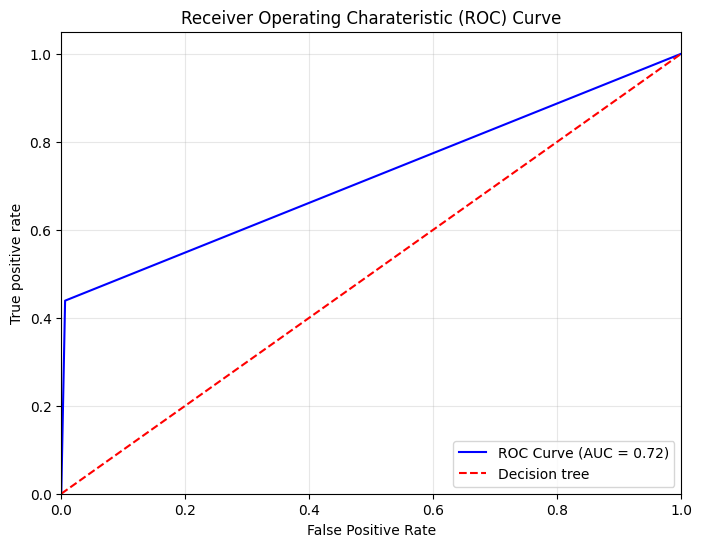

In [7]:
#Calculating ROC curve
fpr, tpr, threshold = roc_curve(y_true = y_test, y_score = pred_test)

#Calculating AUC score 
auc = roc_auc_score(y_true = y_test, y_score = pred_test)

#Plotting roc curve 
plt.figure(figsize = (8, 6))
plt.plot(fpr, tpr, color = 'blue', label = f'ROC Curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], color = 'red', linestyle = '--', label = 'Decision tree')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel(xlabel = "False Positive Rate")
plt.ylabel(ylabel = "True positive rate")
plt.title(label = "Receiver Operating Charateristic (ROC) Curve")
plt.legend(loc = 'lower right')
plt.grid(alpha = 0.3)
plt.show()

In [43]:
#Checking the performance of Random Forest classifier for the problem
rm_classifier = RandomForestClassifier(class_weight='balanced', random_state = 42)
rm_classifier.fit(X = x_train, y = y_train)

pred_train = rm_classifier.predict(X = x_train)
pred_test = rm_classifier.predict(X = x_test)

print(f"Accuracy score of Random Forest Classifier in train dataset is {accuracy_score(y_true = y_train, y_pred = pred_train)}")
print(f"Accuracy score of Random Forest Classifier in test dataset is {accuracy_score(y_true = y_test, y_pred = pred_test)}")

Accuracy score of Random Forest Classifier in train dataset is 0.9992272747100722
Accuracy score of Random Forest Classifier in test dataset is 0.9899235176083985


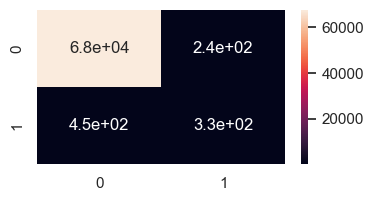

In [44]:
#Confusion matrix 
conf_matrix_model = confusion_matrix(y_true = y_test, y_pred = pred_test)

plt.figure(figsize = (4, 2))
sns.heatmap(data = conf_matrix_model, annot = True)
plt.show()

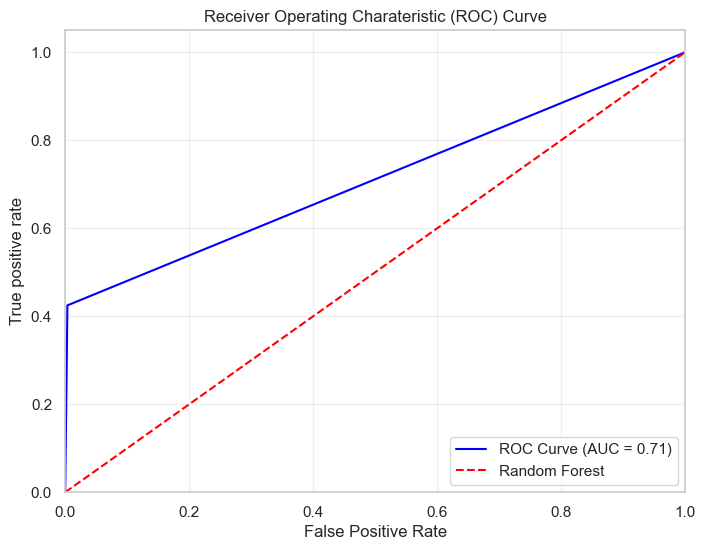

In [46]:
#Calculating ROC curve
fpr, tpr, threshold = roc_curve(y_true = y_test, y_score = pred_test)

#Calculating AUC score 
auc = roc_auc_score(y_true = y_test, y_score = pred_test)

#Plotting roc curve 
plt.figure(figsize = (8, 6))
plt.plot(fpr, tpr, color = 'blue', label = f'ROC Curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], color = 'red', linestyle = '--', label = 'Random Forest')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel(xlabel = "False Positive Rate")
plt.ylabel(ylabel = "True positive rate")
plt.title(label = "Receiver Operating Charateristic (ROC) Curve")
plt.legend(loc = 'lower right')
plt.grid(alpha = 0.3)
plt.show()

In [5]:
#Testing the models performance again using resampling the dataset for tackling up distribution error
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state = 123)
x_resampled, y_resampled = smote.fit_resample(X = x_train, y = y_train)

y_resampled.value_counts()

target_action
0    158665
1    158665
Name: count, dtype: int64

In [48]:
#Checking the performance of Random Forest classifier for the problem
rm_classifier = RandomForestClassifier(class_weight='balanced', random_state = 42)
rm_classifier.fit(X = x_resampled, y = y_resampled)

pred_train = rm_classifier.predict(X = x_train)
pred_test = rm_classifier.predict(X = x_test)

print(f"Accuracy score of Random Forest Classifier in train dataset is {accuracy_score(y_true = y_train, y_pred = pred_train)}")
print(f"Accuracy score of Random Forest Classifier in test dataset is {accuracy_score(y_true = y_test, y_pred = pred_test)}")

Accuracy score of Random Forest Classifier in train dataset is 0.9996697222551115
Accuracy score of Random Forest Classifier in test dataset is 0.990127082909239


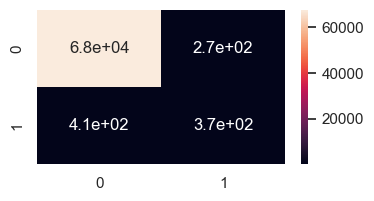

In [49]:
#Confusion matrix 
conf_matrix_model = confusion_matrix(y_true = y_test, y_pred = pred_test)

plt.figure(figsize = (4, 2))
sns.heatmap(data = conf_matrix_model, annot = True)
plt.show()

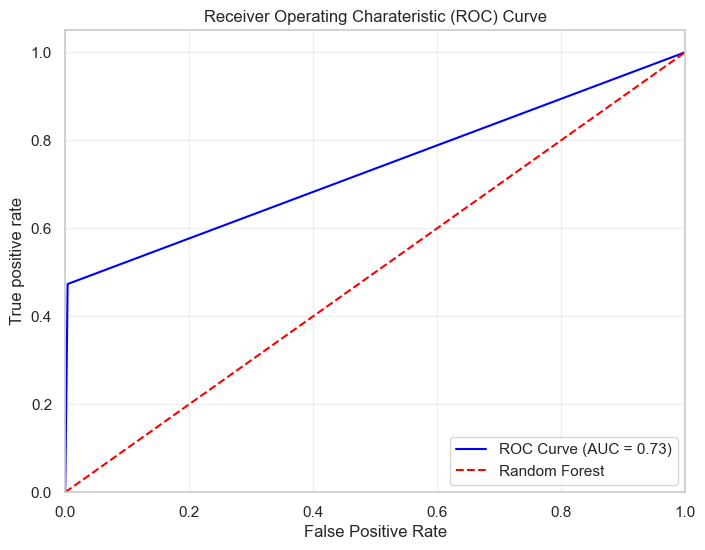

In [50]:
#Calculating ROC curve
fpr, tpr, threshold = roc_curve(y_true = y_test, y_score = pred_test)

#Calculating AUC score 
auc = roc_auc_score(y_true = y_test, y_score = pred_test)

#Plotting roc curve 
plt.figure(figsize = (8, 6))
plt.plot(fpr, tpr, color = 'blue', label = f'ROC Curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], color = 'red', linestyle = '--', label = 'Random Forest')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel(xlabel = "False Positive Rate")
plt.ylabel(ylabel = "True positive rate")
plt.title(label = "Receiver Operating Charateristic (ROC) Curve")
plt.legend(loc = 'lower right')
plt.grid(alpha = 0.3)
plt.show()

In [51]:
#Decision Tree
decision_tree_classifier = DecisionTreeClassifier(random_state = 42)
decision_tree_classifier.fit(X = x_resampled, y = y_resampled)
pred_train = decision_tree_classifier.predict(X = x_train)
pred_test = decision_tree_classifier.predict(X = x_test)

print(f"Accuracy score of trained model on training data : {accuracy_score(y_true = y_train, y_pred = pred_train)}")
print(f"Accuracy score of trained model on test data : {accuracy_score(y_true = y_test, y_pred = pred_test)}")

Accuracy score of trained model on training data : 0.9996697222551115
Accuracy score of trained model on test data : 0.985445080989909


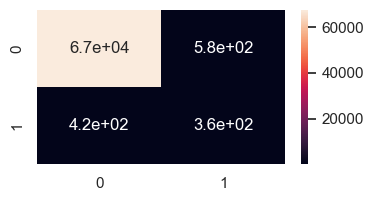

In [52]:
#Confusion matrix 
conf_matrix_model = confusion_matrix(y_true = y_test, y_pred = pred_test)

plt.figure(figsize = (4, 2))
sns.heatmap(data = conf_matrix_model, annot = True)
plt.show()

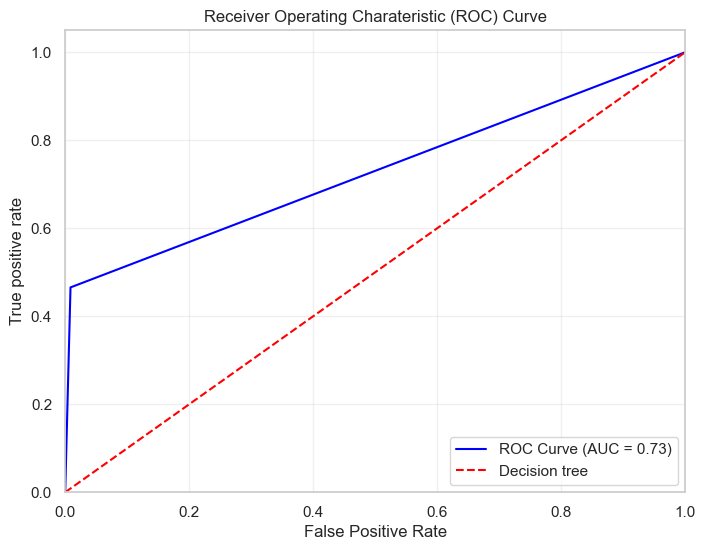

In [53]:
#Calculating ROC curve
fpr, tpr, threshold = roc_curve(y_true = y_test, y_score = pred_test)

#Calculating AUC score 
auc = roc_auc_score(y_true = y_test, y_score = pred_test)

#Plotting roc curve 
plt.figure(figsize = (8, 6))
plt.plot(fpr, tpr, color = 'blue', label = f'ROC Curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], color = 'red', linestyle = '--', label = 'Decision tree')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel(xlabel = "False Positive Rate")
plt.ylabel(ylabel = "True positive rate")
plt.title(label = "Receiver Operating Charateristic (ROC) Curve")
plt.legend(loc = 'lower right')
plt.grid(alpha = 0.3)
plt.show()

In [6]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

#Creating pipeline for sampling strategy 
over = SMOTE(sampling_strategy = 0.1)
under = RandomUnderSampler(sampling_strategy = 0.5)
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps = steps)

x_resampled_pipeline, y_resampled_pipeline = pipeline.fit_resample(X = x_train, y = y_train)

In [7]:
#Checking the performance of Random Forest classifier for the problem
rm_classifier_pipeline = RandomForestClassifier(random_state = 100)
rm_classifier_pipeline.fit(X = x_resampled_pipeline, y = y_resampled_pipeline)

pred_train = rm_classifier_pipeline.predict(X = x_train)
pred_test = rm_classifier_pipeline.predict(X = x_test)

print(f"Accuracy score of Random Forest Classifier in train dataset is {accuracy_score(y_true = y_train, y_pred = pred_train)}")
print(f"Accuracy score of Random Forest Classifier in test dataset is {accuracy_score(y_true = y_test, y_pred = pred_test)}")

Accuracy score of Random Forest Classifier in train dataset is 0.9899608028865029
Accuracy score of Random Forest Classifier in test dataset is 0.9831622415447698


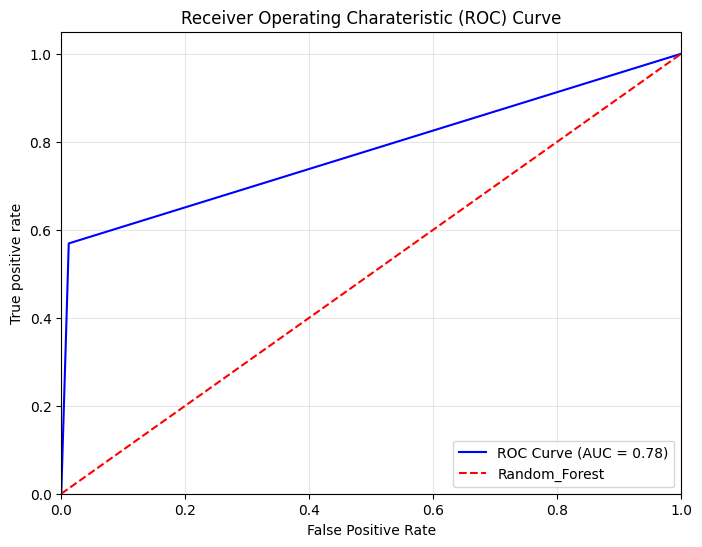

In [8]:
#Calculating ROC curve
fpr, tpr, threshold = roc_curve(y_true = y_test, y_score = pred_test)

#Calculating AUC score 
auc = roc_auc_score(y_true = y_test, y_score = pred_test)

#Plotting roc curve 
plt.figure(figsize = (8, 6))
plt.plot(fpr, tpr, color = 'blue', label = f'ROC Curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], color = 'red', linestyle = '--', label = 'Random_Forest')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel(xlabel = "False Positive Rate")
plt.ylabel(ylabel = "True positive rate")
plt.title(label = "Receiver Operating Charateristic (ROC) Curve")
plt.legend(loc = 'lower right')
plt.grid(alpha = 0.3)
plt.show()

In [10]:
#Saving the end result in pickle format
pkl.dump(rm_classifier_pipeline, open('./models/model.pkl', 'wb'))

These codes below is for only educational purpose only. 
Currently I have came across one article about tabular teaching in fastai, here I am going to test the performance of this module in this problem.

In [3]:
from fastai.tabular.all import *

df_fastai = pd.read_csv(filepath_or_buffer = "./data/ga_hits.csv")
df_session_fastai = pd.read_csv(filepath_or_buffer = './data/ga_sessions.csv')
total_dataframe_fastai = pd.merge(left = df_fastai, right = df_session_fastai, on = "session_id")

#Labelling target action column with 1 if the action in the row of the given dataset is target action and 0 if the action is not the action which we are considering
target_actions = ['sub_car_claim_click', 'sub_car_claim_submit_click', 'sub_open_dialog_click', 'sub_custom_question_submit_click', 'sub_call_number_click', 'sub_callback_submit_click', 'sub_submit_success', 'sub_car_request_submit_click']
total_dataframe_fastai['target_action'] = 0
total_dataframe_fastai.loc[total_dataframe_fastai['event_action'].isin(target_actions), 'target_action'] = 1

#Dropping unnecessary columns from the dataset
total_dataframe_fastai.drop(columns = ['device_model', 'event_action', 'event_value', 'utm_keyword', 'client_id', 'device_brand', 'event_category', 'visit_date', 'session_id', 'hit_time'], inplace = True)
total_dataframe_fastai.drop_duplicates(inplace = True)
total_dataframe_fastai.head()

C:\Users\User\AppData\Local\Temp\ipykernel_17096\2789982065.py:4: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_session_fastai = pd.read_csv(filepath_or_buffer = './data/ga_sessions.csv')


,hit_date,hit_number,hit_type,hit_referer,hit_page_path,event_label,visit_time,visit_number,utm_source,utm_medium,utm_campaign,utm_adcontent,device_category,device_os,device_screen_resolution,device_browser,geo_country,geo_city,target_action
0,2021-12-23,30,event,NaN,sberauto.com/cars?utm_source_initial=google&utm_medium_initial=cpc&utm_campaign_initial=bJJuEXRheRIxXEaYIXqM|BmWKiKCvBVipoWOpNUIL&utm_content_initial=yXzSAJWSuRbYeLFyMVFl|iJxXDTgPAXGQYOdgCzqe|xAEYTlJDbQNwQTLGxICQ|pmvTbUlmnwAkuHIbvKUg|lFpAoUqEvHoyZfCNRuCR|oxjYxrkwnRSTTYcVZzdb|dtYJKUplNmmKCOfiziff|NgTCwCMgdzcCqxiALuwY|aHSPdWXGkJravzWuwcJA|HbolMJUevblAbkHClEQa|kqZPVvZmXADsCZxIQwbv|QaGunexmXrztCWbLcYxs|OfdDOXSwHYclonQJpPxh|htxLmqvAkmISCliXGMzb|HbolMJUevblAbkHClEQa&utm_term_initial=&city=1&rental_page=rental_only&rental_car=rental_only&city=18,NaN,13:07:36,2,kjsLglQLzykiRbcDiGcD,cpc,NaN,NaN,mobile,Android,360x780,Chrome,Russia,Saint Petersburg,0
1,2021-12-23,12,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_source_initial=google&utm_medium_initial=cpc&utm_campaign_initial=bJJuEXRheRIxXEaYIXqM|BmWKiKCvBVipoWOpNUIL&utm_content_initial=yXzSAJWSuRbYeLFyMVFl|iJxXDTgPAXGQYOdgCzqe|xAEYTlJDbQNwQTLGxICQ|pmvTbUlmnwAkuHIbvKUg|lFpAoUqEvHoyZfCNRuCR|oxjYxrkwnRSTTYcVZzdb|dtYJKUplNmmKCOfiziff|NgTCwCMgdzcCqxiALuwY|aHSPdWXGkJravzWuwcJA|HbolMJUevblAbkHClEQa|kqZPVvZmXADsCZxIQwbv|QaGunexmXrztCWbLcYxs|OfdDOXSwHYclonQJpPxh|htxLmqvAkmISCliXGMzb|HbolMJUevblAbkHClEQa&utm_term_initial=&rental_page=rental_car,NaN,13:07:36,2,kjsLglQLzykiRbcDiGcD,cpc,NaN,NaN,mobile,Android,360x780,Chrome,Russia,Saint Petersburg,0
2,2021-12-23,18,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd2b?utm_source_initial=google&utm_medium_initial=cpc&utm_campaign_initial=bJJuEXRheRIxXEaYIXqM|BmWKiKCvBVipoWOpNUIL&utm_content_initial=yXzSAJWSuRbYeLFyMVFl|iJxXDTgPAXGQYOdgCzqe|xAEYTlJDbQNwQTLGxICQ|pmvTbUlmnwAkuHIbvKUg|lFpAoUqEvHoyZfCNRuCR|oxjYxrkwnRSTTYcVZzdb|dtYJKUplNmmKCOfiziff|NgTCwCMgdzcCqxiALuwY|aHSPdWXGkJravzWuwcJA|HbolMJUevblAbkHClEQa|kqZPVvZmXADsCZxIQwbv|QaGunexmXrztCWbLcYxs|OfdDOXSwHYclonQJpPxh|htxLmqvAkmISCliXGMzb|HbolMJUevblAbkHClEQa&utm_term_initial=&rental_page=rental_car,NaN,13:07:36,2,kjsLglQLzykiRbcDiGcD,cpc,NaN,NaN,mobile,Android,360x780,Chrome,Russia,Saint Petersburg,0
3,2021-12-23,20,event,NaN,sberauto.com/cars/all/volkswagen/tiguan/0208cd2b?utm_source_initial=google&utm_medium_initial=cpc&utm_campaign_initial=bJJuEXRheRIxXEaYIXqM|BmWKiKCvBVipoWOpNUIL&utm_content_initial=yXzSAJWSuRbYeLFyMVFl|iJxXDTgPAXGQYOdgCzqe|xAEYTlJDbQNwQTLGxICQ|pmvTbUlmnwAkuHIbvKUg|lFpAoUqEvHoyZfCNRuCR|oxjYxrkwnRSTTYcVZzdb|dtYJKUplNmmKCOfiziff|NgTCwCMgdzcCqxiALuwY|aHSPdWXGkJravzWuwcJA|HbolMJUevblAbkHClEQa|kqZPVvZmXADsCZxIQwbv|QaGunexmXrztCWbLcYxs|OfdDOXSwHYclonQJpPxh|htxLmqvAkmISCliXGMzb|HbolMJUevblAbkHClEQa&utm_term_initial=&rental_page=rental_car,NaN,13:07:36,2,kjsLglQLzykiRbcDiGcD,cpc,NaN,NaN,mobile,Android,360x780,Chrome,Russia,Saint Petersburg,0
4,2021-12-23,8,event,NaN,sberauto.com/cars/all/kia/seltos/20f30855?utm_source_initial=google&utm_medium_initial=cpc&utm_campaign_initial=bJJuEXRheRIxXEaYIXqM|BmWKiKCvBVipoWOpNUIL&utm_content_initial=yXzSAJWSuRbYeLFyMVFl|iJxXDTgPAXGQYOdgCzqe|xAEYTlJDbQNwQTLGxICQ|pmvTbUlmnwAkuHIbvKUg|lFpAoUqEvHoyZfCNRuCR|oxjYxrkwnRSTTYcVZzdb|dtYJKUplNmmKCOfiziff|NgTCwCMgdzcCqxiALuwY|aHSPdWXGkJravzWuwcJA|HbolMJUevblAbkHClEQa|kqZPVvZmXADsCZxIQwbv|QaGunexmXrztCWbLcYxs|OfdDOXSwHYclonQJpPxh|htxLmqvAkmISCliXGMzb|HbolMJUevblAbkHClEQa&utm_term_initial=&rental_page=rental_car,NaN,13:07:36,2,kjsLglQLzykiRbcDiGcD,cpc,NaN,NaN,mobile,Android,360x780,Chrome,Russia,Saint Petersburg,0


In [4]:
categorical_cols_fastai = ['hit_date', 'hit_type', 'hit_referer', 'hit_page_path', 'event_label', 'visit_time', 'utm_source', 'utm_medium', 'utm_campaign', 'utm_adcontent', 'device_category', 'device_os', 'device_screen_resolution', 'device_browser', 'geo_country', 'geo_city']
numerical_cols_fastai = ['hit_number', 'visit_number']

In [4]:
total_dataframe_fastai_train, total_dataframe_fastai_test = train_test_split(total_dataframe_fastai, test_size = 0.2, random_state = 42)
total_dataframe_fastai_train.shape

(12405906, 19)

In [6]:
dls = TabularDataLoaders.from_df(df = total_dataframe_fastai_train, bs = 64, y_names = 'target_action', skipinitialspace = False, cat_names = categorical_cols_fastai, cont_names = numerical_cols_fastai, procs = [Categorify, FillMissing, Normalize])
learn = tabular_learner(dls, metrics = accuracy)
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,time


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\fastai\learner.py:448: SyntaxWarning: invalid escape sequence '\R'
  e.args = [f"Custom classes or functions exported with your `Learner` not available in namespace.\Re-declare/import before loading:\n\t{e.args[0]}"]


KeyboardInterrupt: 

In [5]:
total_dataframe_fastai_samples = total_dataframe_fastai.sample(n = 500000, random_state = 42)
total_dataframe_fastai_train_samples, total_dataframe_fastai_test_samples = train_test_split(total_dataframe_fastai_samples, test_size = 0.2, random_state = 42)
dls = TabularDataLoaders.from_df(df = total_dataframe_fastai_train_samples, bs = 64, y_names = 'target_action', skipinitialspace = False, cat_names = categorical_cols_fastai, cont_names = numerical_cols_fastai, procs = [Categorify, FillMissing, Normalize])
learn = tabular_learner(dls, metrics = accuracy)
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,time
0,0.001339,0.003935,0.993100,05:59
1,0.000992,0.004102,0.993100,05:07
2,0.001019,0.001717,0.993100,04:26
3,0.001223,0.001665,0.993100,04:23


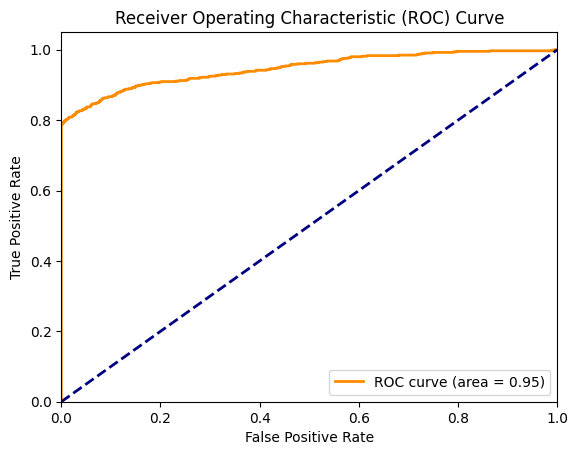

In [7]:
from sklearn.metrics import auc
test_sample = total_dataframe_fastai.sample(n = 100000, random_state = 12)

test_dl = dls.test_dl(test_sample)
preds, targs = learn.get_preds(dl = test_dl)

pred_probs = preds
true_labels = targs

fpr, tpr, _ = roc_curve(true_labels, pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [8]:
#Saving the end result in pickle format
pkl.dump(learn, open('./models/fast_ai_500000.pkl', 'wb'))